# Estimation and analysis of mutual information in a recurrent neural network

Project for *Information Theory and Inference*

**Group members**:
* Golan Rodrigo
* Zoppellari Elena

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import logsumexp
import scipy.spatial as ss
from scipy.special import digamma
from math import log
import numpy.random as nr
import random
from scipy.special import logsumexp
from scipy.stats import multivariate_normal

## 1. Introduction 

Mutual information, a fundamental concept in information theory, quantifies the amount of information that one random variable contains about another random variable. Estimating mutual information is crucial in various machine learning and statistical tasks. In what follows we will make use of some methods for mutual information estimation to give insigths about neural networks trained to perform a cognitive task. In particular, we will focus on an already trained recurrent neural network, inspecting its learnt understanding of the task through an information content lens.

In [2]:
with np.load('rnn_data.npz') as data:
    x = data["arr_0"] # input: each element is a sequence of 90sx32degrees
    y = data["arr_1"] # output: each element is a sequence of 90sx32degrees as well 
    h = data["arr_2"] # recurrent layer: each input sequence, for each time-step passes through 256 neurons
    y_true = data["arr_3"] # true label: a target degree for each input

In [3]:
x.shape, y.shape, h.shape, y_true.shape

((200, 90, 32), (200, 90, 32), (200, 90, 256), (200,))

In [79]:
x_noiseless=x.copy()
y_noiseless=y.copy()
x_noiseless[x_noiseless<.1]=0
y_noiseless[y_noiseless<.1]=0

The dataset represents the task GO from the study of Yang et al. (2019)<sup>[1]</sup>, in which a stimulus at a specific direction is given as input during a time range of 90 seconds and the network is trained to be able to respond in the same direction. The network is a RNN composed of a single hidden layer with $N_{rec}=256$ neurons and the training has been performed on 200 input signals. Each signal is represented by a Gaussian distribution ranging from 0 to 32 degrees, peaked at the stimulus direction during active times, or noise during non-active times.

The discrete equations that describe the network are:

$\textbf{r}_t = (1-\alpha)\textbf{r}_{t-1}+\alpha f(W^{rec}\textbf{r}_{t-1}+W^{in}\textbf{u}_{t}+\textbf{b}+\sqrt{2 \alpha^{-1}\sigma^2_{rec}}N(0,1))$
<br>

$\textbf{y} = g(W^{out}\textbf{r})$<br>

where $\textbf{r}_t$ is the recurrent layer at time $t$, $\alpha = \Delta t / \tau$ is the discretization step ($\tau \sim 100 ms$ neuronal time constant), $\textbf{u}_{t}$ is the input at time $t$, $f(x) = log(1+exp(x))$ is the neuronal non-linearity, $\sigma_{rec}=0.05$ is the strenght of noise, $g(x)$ is the logistic function and $W^{in}$, $W^{rec}$ and $W^{out}$ are input, recurrent and output matrices.

[1]: Yang, G.R., Joglekar, M.R., Song, H.F. et al. Task representations in neural networks trained to perform many cognitive tasks. Nat Neurosci 22, 297–306 (2019)

## 2. Dataset visualization

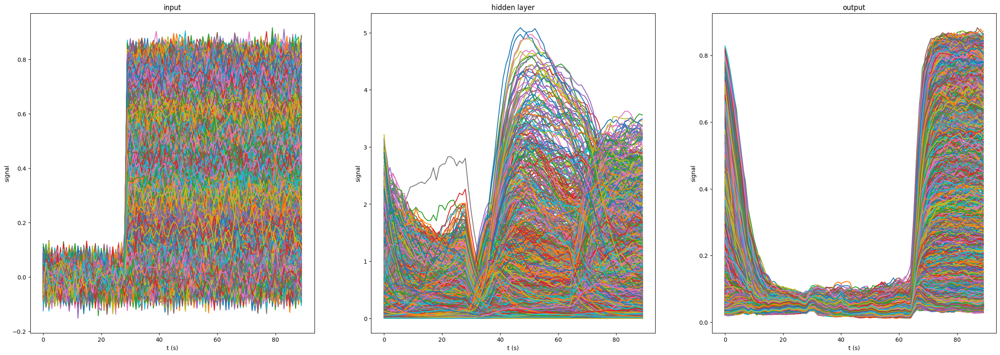

In [44]:
# coarse visualtization
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30,10))
for j in range(200):
    for d in range(32):
        ax[0].plot(range(90), x[j,:,d])
        ax[0].set_title("input")
        ax[2].plot(range(90), y[j,:,d])
        ax[2].set_title("output")
    for n in range(256):
        ax[1].plot(range(90), h[j,:,n])
        ax[1].set_title("hidden layer")
    for i in range(3):
        ax[i].set_xlabel("t (s)")
        ax[i].set_ylabel("signal")

In the plots above, we can observe the coarse shape of the data. We immediately realize that the input signal becomes active after exactly $30$ seconds for each sample. Before that moment, the signal is represented by noise. Therefore, we expect that the entropy before $30$ seconds is very low, since all signals are very similar and poorly informative. On the other hand, during activation times, the signals are very different from each other since they represent Gaussians peaked at different angles. Therefore, we expect higher entropy.

Similarly, we can observe that the output still returns a clear signal until around $10-15$ seconds, while becoming active again after around $65$ seconds. In this case, the boundaries are not defined as clearly as for the input.

### 2.1 input data

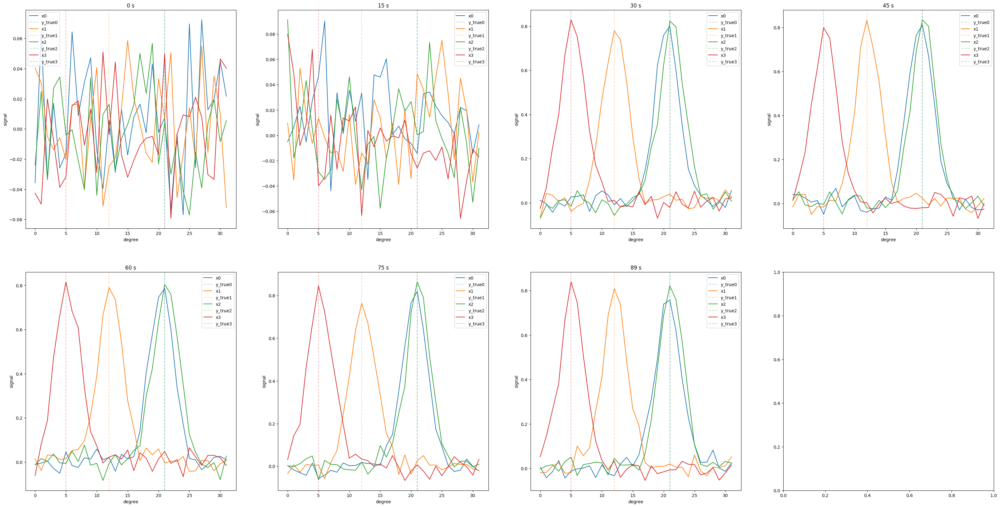

In [8]:
# comparing time evolution of n_data trials
time_step = 15 # dt, time steps
n_plots = int(x.shape[1]/time_step)+1
n_data = 4 # how many trials we want to visualize
n_cols = 4
if n_plots%n_cols == 0:
    n_rows = int(n_plots/n_cols)
else:
    n_rows = int(n_plots/n_cols)+1
fig, ax = plt.subplots(nrows=n_rows,ncols=n_cols,figsize=(n_cols*10,n_rows*10))
for j in range(n_plots):
    for i in range(n_data): 
        if j == n_plots-1:
            color = ax[j//n_cols][j%n_cols].plot(range(x[i][(-1)].shape[0]), x[i][(-1)], label="x{}".format(i))[0].get_color()
            ax[j//n_cols][j%n_cols].axvline(y_true[i], alpha=0.3, label="y_true{}".format(i), linestyle="--", color=color)
            ax[j//n_cols][j%n_cols].legend(loc="best")
            ax[j//n_cols][j%n_cols].set_title("89 s")
            ax[j//n_cols][j%n_cols].set_xlabel("degree")
            ax[j//n_cols][j%n_cols].set_ylabel("signal")
        else:
            color = ax[j//n_cols][j%n_cols].plot(range(x[i][(j*time_step)].shape[0]), x[i][(j*time_step)], label="x{}".format(i))[0].get_color()
            ax[j//n_cols][j%n_cols].axvline(y_true[i], alpha=0.3, label="y_true{}".format(i), linestyle="--", color=color)
            ax[j//n_cols][j%n_cols].legend(loc="best")
            ax[j//n_cols][j%n_cols].set_title("{} s".format(j*time_step))
            ax[j//n_cols][j%n_cols].set_xlabel("degree")
            ax[j//n_cols][j%n_cols].set_ylabel("signal")

The plots show the evolution of the input signal over time: it becomes active after 30 seconds.

### 2.2 output data

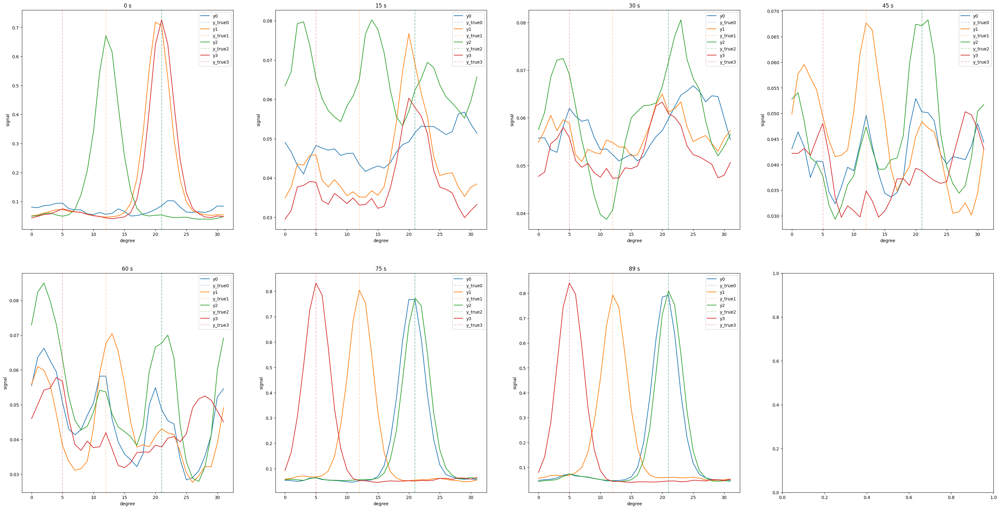

In [9]:
time_step = 15 # dt, time steps
n_plots = int(x.shape[1]/time_step)+1
n_data = 4 # how many sequence samples we want to visualize
n_cols = 4
if n_plots%n_cols == 0:
    n_rows = int(n_plots/n_cols)
else:
    n_rows = int(n_plots/n_cols)+1
fig, ax = plt.subplots(nrows=n_rows,ncols=n_cols,figsize=(n_cols*10,n_rows*10))
for j in range(n_plots):
    for i in range(n_data): 
        if j == n_plots-1:
            color = ax[j//n_cols][j%n_cols].plot(range(y[i][(-1)].shape[0]), y[i][(-1)], label="y{}".format(i))[0].get_color()
            ax[j//n_cols][j%n_cols].axvline(y_true[i], alpha=0.3, label="y_true{}".format(i), linestyle="--", color=color)
            ax[j//n_cols][j%n_cols].legend(loc="best")
            ax[j//n_cols][j%n_cols].set_title("89 s")
            ax[j//n_cols][j%n_cols].set_xlabel("degree")
            ax[j//n_cols][j%n_cols].set_ylabel("signal")
        else:
            color = ax[j//n_cols][j%n_cols].plot(range(y[i][(j*time_step)].shape[0]), y[i][(j*time_step)], label="y{}".format(i))[0].get_color()
            ax[j//n_cols][j%n_cols].axvline(y_true[i], alpha=0.3, label="y_true{}".format(i), linestyle="--", color=color)
            ax[j//n_cols][j%n_cols].legend(loc="best")
            ax[j//n_cols][j%n_cols].set_title("{} s".format(j*time_step))
            ax[j//n_cols][j%n_cols].set_xlabel("degree")
            ax[j//n_cols][j%n_cols].set_ylabel("signal")

In the plots we can observe the behaviour of the output: for the first 10-15 sec is peaked on the past observation. It transitions gradually between around 10 and 64 sec, until reaching the right peak after 65 sec.

## 3. Discrete MI estimation: binning approach 

Since our dataset is composed of continuous distributions, the binning approach might not seem the most suitable one; however, it is useful to understand the deep nature of our problem.

Our input data $X$ and output $Y$ can be seen as 200 combinations of 32 values: $\forall x_i \in X: x_i = [x_{i,1},...,x_{i,32}]$, $\forall y_i \in Y: y_i = [y_{i,1},...,y_{i,32}]$. Each of these combinations is unique in the dataset, as the data are discretized representations of a continuous signal. Nevertheless, it is possible to approximate the values in the combination in order to obtain combinations that have a frequency $f > 1$, or, in other words, to obtain groups.

Consider the situation in which we want to evaluate the mutual information between the input data $X$ and the hidden representation $h$ through the definition: $MI(X:h) = H(h) - H(h|X)$. <br> The first step is to decide the number of bins and consequently determine the bin size: $binsize = 2/nbins$. This value is consequently used to rescale the data of both the input and hidden data and then approximate the result to the closest integer: $\tilde{x}_i = \text{int}(x_i/binsize)$, $\tilde{h}_i = \text{int}(h_i/binsize)$. Depending on the choice of the number of bins, this step can transform the values in the combination in a way that it is possible that multiple combinations are groupable. We call $\gamma_k$ the $k$-th unique group for hidden representation and $g_j$ the $j$-th unique group for input data, and associate to each of them a probability $p_k$ and $p_j$, respectively. We compute the entropy of hidden representations as $H(h)=-\sum_k p_k \log(p_k)$.

At this point, for each $g_j$, we identify the associated elements in $\tilde{h}$, a subset $\tilde{h}_j$ which, of course, will have the same number of elements as $g_j$. To each $\tilde{h}(i|j)$, we associate a probability value $p(i|j)$ such that $\sum_i p(i|j) = 1$. These resulting probabilities are the conditional probabilities of $h$ given $X$, and therefore we compute the conditional entropy as: $ H(h|X) = \sum_j p_j \cdot H(h|j) = -\sum_j p_j \cdot \sum_i p(i|j) \log(p(i|j))$.

### 3.1 Analysis on the number of groups formed for different nbins.

Depending on the choice of nbins, the groupability of input and output data can vary. We performed a preliminary analysis, calculating the minimum and maximum number of groups that form for input and output independently according to nbins at active times. 

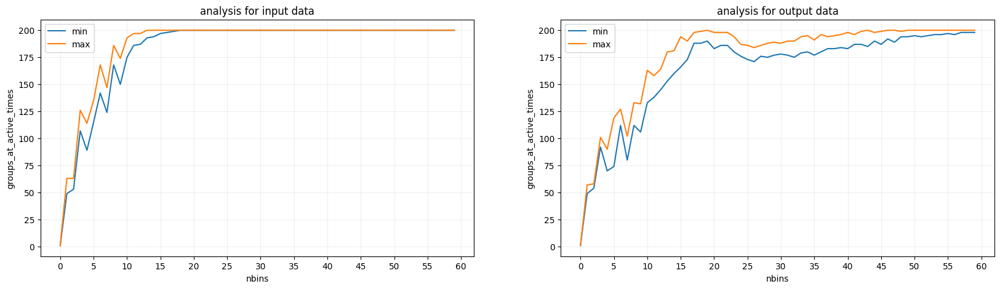

In [17]:
# how many groups can be formed based on nbins?
min_x = []
min_y = []
max_x = []
max_y = []
max_binning = 60
for b in range(max_binning):
    nbins = b + 1
    n_unique_x = []
    n_unique_y = []
    for t in range(90):
        x_inp = x[:,t,:]
        y_inp = y[:,t,:]
        bin_max = 1
        bin_min = -1
        binsize = (bin_max-bin_min)/nbins
        
        # x input
        digitized_x = np.rint(x_inp/binsize).astype('int')
        digitized_y = np.rint(y_inp/binsize).astype('int')
        unique_rows_x, freq_x = np.unique(digitized_x, axis=0, return_counts=True)
        unique_rows_y, freq_y = np.unique(digitized_y, axis=0, return_counts=True)
        
        if t >= 29:
            #print(x_inp/binsize)
            n_unique_x.append(unique_rows_x.shape[0])
        if t >= 70:
            n_unique_y.append(unique_rows_y.shape[0])

    min_x.append(min(n_unique_x))
    min_y.append(min(n_unique_y))
    max_x.append(max(n_unique_x))
    max_y.append(max(n_unique_y))
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
ax[0].plot(range(max_binning), min_x, label="min")
ax[1].plot(range(max_binning), min_y, label="min")
ax[0].plot(range(max_binning), max_x, label="max")
ax[1].plot(range(max_binning), max_y, label="max")
ax[0].set_title("analysis for input data")
ax[1].set_title("analysis for output data")
for i in range(2):
    ax[i].set_xlabel("nbins")
    ax[i].set_ylabel("groups_at_active_times")
    ax[i].grid(alpha=0.2)
    ax[i].set_xticks(np.linspace(0, max_binning, 13))
    ax[i].legend()

We know that the signal spans between 0 and 32. Therefore, we expect that the correct number of groups should be around 32. We observe that this is not the case for any nbins, but the closest result is given by nbins=2 for both input and output.

The inputs can be grouped if nbins < 15, while the output can be grouped if nbins < 50, but binsize choices too close to this upper limit might be inefficient. The reason behind the different behavior of input and output could lie in the higher noise presence in the input, which is more difficult to group. In order to maintain consistency, in the following section, we use the same binsize for both input and output.

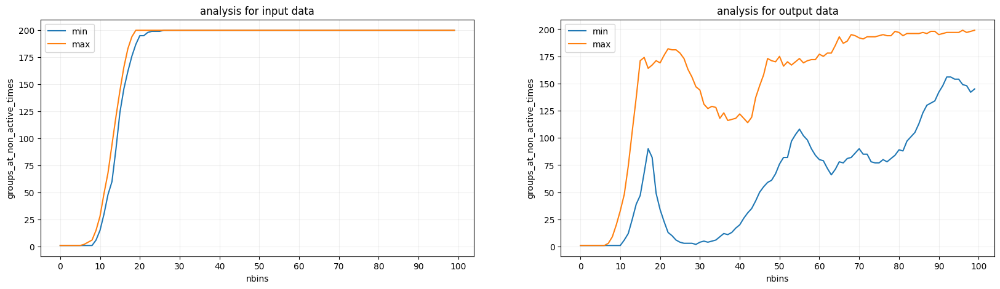

In [28]:
# how many groups can be formed based on binsize?
min_x = []
min_y = []
max_x = []
max_y = []
max_binning = 100
for b in range(max_binning):
    nbins = b + 1
    n_unique_x = []
    n_unique_y = []
    for t in range(90):
        x_inp = x[:,t,:]
        y_inp = y[:,t,:]
        bin_max = 1
        bin_min = -1
        binsize = (bin_max-bin_min)/nbins
        
        # x input
        digitized_x = np.rint(x_inp/binsize).astype('int')
        digitized_y = np.rint(y_inp/binsize).astype('int')
        unique_rows_x, freq_x = np.unique(digitized_x, axis=0, return_counts=True)
        unique_rows_y, freq_y = np.unique(digitized_y, axis=0, return_counts=True)
        
        if t < 29:
            #print(x_inp/binsize)
            n_unique_x.append(unique_rows_x.shape[0])
        if t < 60 and t > 20:
            n_unique_y.append(unique_rows_y.shape[0])

    min_x.append(min(n_unique_x))
    min_y.append(min(n_unique_y))
    max_x.append(max(n_unique_x))
    max_y.append(max(n_unique_y))
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
ax[0].plot(range(max_binning), min_x, label="min")
ax[1].plot(range(max_binning), min_y, label="min")
ax[0].plot(range(max_binning), max_x, label="max")
ax[1].plot(range(max_binning), max_y, label="max")
ax[0].set_title("analysis for input data")
ax[1].set_title("analysis for output data")
for i in range(2):
    ax[i].set_xlabel("nbins")
    ax[i].set_ylabel("groups_at_non_active_times")
    ax[i].grid(alpha=0.2)
    ax[i].set_xticks(np.linspace(0, max_binning, 11))
    ax[i].legend()

At non-active time, the number of groups increases rapidly after nbins > 10 for input data, while outputs have an nonlinear behaviour. It is safe to affirm that selecting $nbins \leq 10$ for both input and output guarantees that at non-active times data are grouped as noise.

### 3.2 Binning for different binsizes

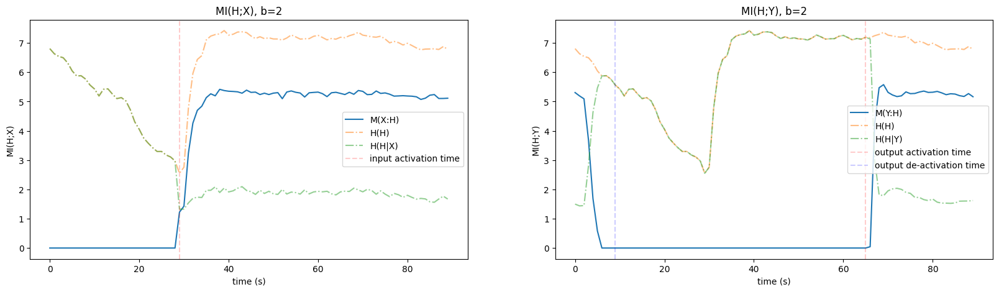

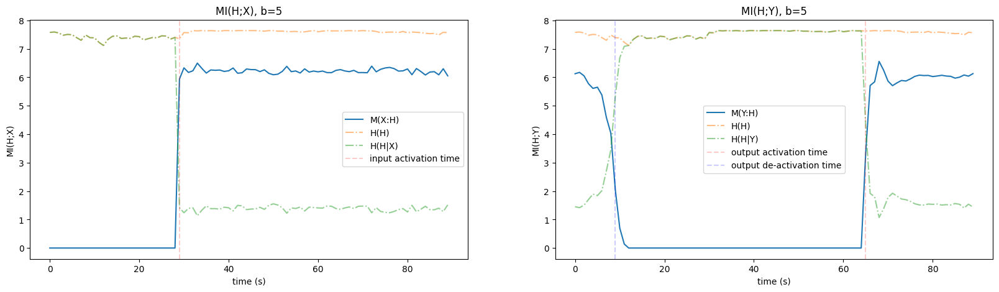

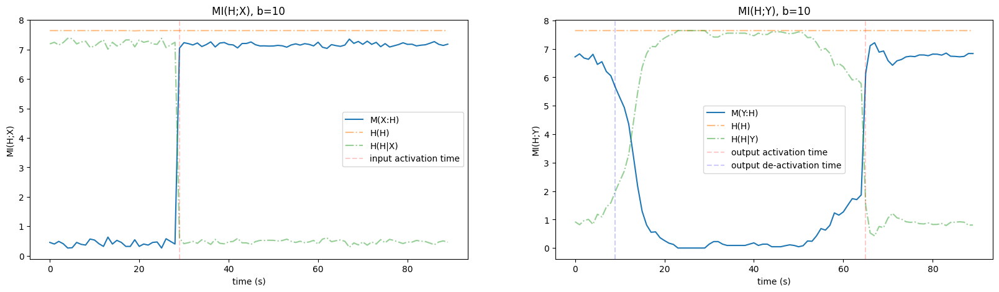

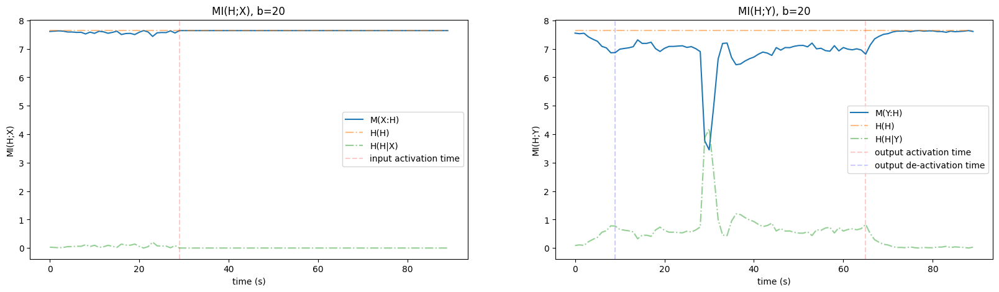

In [8]:
# hard discretization technique
def hard_binning(x_inp, h_inp, nbins=2):
    bin_max = 1
    bin_min = -1
    binsize= (bin_max-bin_min)/nbins
    
    # x input
    #x_inp[(x_inp < 0.1)] = 0 # noise removal
    digitized_x = np.rint(x_inp/binsize).astype('int')
    unique_rows, freq_x = np.unique(digitized_x, axis=0, return_counts=True)
    prob_x = freq_x/x_inp.shape[0]
    entropy_x = shannon_entropy(prob_x)
    
    # h input
    digitized_h = np.rint(h_inp/binsize).astype('int')
    unique_h, freq_h = np.unique(digitized_h, axis=0, return_counts=True)
    prob_h = freq_h/h_inp.shape[0]
    entropy_h = shannon_entropy(prob_h)
    
    # conditional probability
    entropy_h_cond_x = []
    for i, row in enumerate(unique_rows):
        # I search for all the h associated to the discretized x row
        associated_h = digitized_h[np.all(digitized_x == row, axis=1)]
        # conditional probability
        unique_h_cond, freq_h_cond_x_i = np.unique(associated_h, axis=0, return_counts=True)
        prob_h_cond_x_i = freq_h_cond_x_i/associated_h.shape[0]
        entropy_h_cond_x_i = shannon_entropy(prob_h_cond_x_i)
        entropy_h_cond_x.append(prob_x[i]*entropy_h_cond_x_i)
    entropy_cond = sum(entropy_h_cond_x)
    return entropy_x, entropy_h, entropy_cond, entropy_h - entropy_cond

def normalize(X):
    X = np.abs(X)
    Z = np.repeat(X.sum(axis=1), repeats=X.shape[1], axis=0).reshape(X.shape[0],X.shape[1])
    return X/Z

def shannon_entropy(X):
    return sum([-i*np.log(i)/np.log(2) if i != 0 else 0 for i in X])
    
def shannon_entropy2d(X):
    return sum([-i*np.log(i)/np.log(2) if i != 0 else 0 for j in X for i in j])

for b in [2, 5, 10, 20]:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
    MI_xh_bin = []
    MI_yh_bin = []
    shannon_x = []
    shannon_y = []
    shannon_h = []
    cond_entropy_x = []
    cond_entropy_y = []
    for t in range(90):
        h_x, h_h, c_x, mi = hard_binning(x[:,t,:], h[:,t,:], b)
        MI_xh_bin.append(mi)
        shannon_x.append(h_x)
        shannon_h.append(h_h)
        cond_entropy_x.append(c_x)
        h_y, _, c_y, mi2 = hard_binning(y[:,t,:], h[:,t,:], b)
        MI_yh_bin.append(mi2)
        shannon_y.append(h_y)
        cond_entropy_y.append(c_y)
        
    ax[0].plot(range(90), MI_xh_bin, label="M(X:H)")
    ax[1].plot(range(90), MI_yh_bin, label="M(Y:H)")
    ax[0].plot(range(90), shannon_h, linestyle="-.", label="H(H)", alpha=0.5)
    ax[1].plot(range(90), shannon_h, linestyle="-.", label="H(H)", alpha=0.5)
    #ax[0].plot(range(90), shannon_x, label="H(X)")
    #ax[1].plot(range(90), shannon_y, label="H(Y)")
    ax[0].plot(range(90), cond_entropy_x, linestyle="-.", label="H(H|X)", alpha=0.5)
    ax[1].plot(range(90), cond_entropy_y, linestyle="-.", label="H(H|Y)", alpha=0.5)
    ax[0].set_xlabel("time (s)")
    ax[0].set_ylabel("MI(H;X)")
    ax[0].set_title("MI(H;X), b={}".format(b))
    ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.2, label="input activation time")
    ax[1].set_ylabel("MI(H;Y)")
    ax[1].set_xlabel("time (s)")
    ax[1].set_title("MI(H;Y), b={}".format(b))
    ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.2, label="output activation time")
    ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.2, label="output de-activation time")
    ax[1].legend()
    ax[0].legend()
    plt.plot()

First of all, in the plots above, we can observe how the choice of $nbins=20$ fails to group the noise for both input and output.

Then, we also observe that the entropy increases with the number of nbins. In fact, the higher the number of groups, the smaller is the probability associated with each group, increasing its informative content. Since we know that the best choice in this framework is $nbins = 2$, we deduce that the mutual information content should be around 5 at active times.

Another interesting observation is related to the shapes of $H(h)$ and $H(h|X)$ (or $H(h|Y)$): their shapes are coincident for the non-active times because the signal is grouped into a single noise group, while the conditional entropy significantly decreases during active times.

## 4. Gaussian estimator: upper and lower bounds

In their 2017 paper, Kolchinsky and Tracey<sup>[1]</sup> proposed a family of estimators based on a pairwise distance to compute the entropy of a mixture of distributions. Given a mixture distribution $p_X$, it can be decomposed into: $p_X=\sum_i c_i p_i(x)$ where $c_i$ is the weight of the $i$-th component and $p_i(x)$ is its probability density. Since $c_i>0$ and $\sum_i c_i = 1$, they can be seen as the probabilities of outcomes of a random variable $C$. The family of estimators is given by:
$$
\hat{H}_D = H(X|C)-\sum_i c_i \ln{\sum_j c_j e^{-D(p_i||p_j)}}
$$
where $D(p_i||p_j)$ is a generalized distance function between $p_i(x)$ and $p_j(x)$. In particular, they identified two distributions able to return tight upper and lower bounds to the estimate of entropy:

* **Upper**: Kullback-Leibler divergence $KL(p||q) = \int p(x) \log \frac{p(x)}{q(x)}dx$
* **Lower**: Chernoff divergence with $\alpha = 0.5$ (also called Bhattacharyya distance) $C_{0.5}(p||q) = BD(p||q) = -ln\int \sqrt{p(x)q(x)}dx$

It is worth mentioning that these two bounds become similar in three situations:

1. When the distance is very large: $D(p||q) \rightarrow +\infty \Rightarrow e^{-BD(p||q)} \simeq e^{-KL(p||q)} \simeq 0$
2. When the distance is very small: $D(p||q) \rightarrow 0 \Rightarrow e^{-BD(p||q)} \simeq e^{-KL(p||q)} \simeq 1$
3. When clusters are well identifiable (elements in the same group have a small distance, while the distance from an element belonging to a different group is high). This situation includes also the previous two.


Given two d-dimensional Gaussian probability densities $p_1 = \mathcal{N}(\mu_1,\Sigma_1)$ and $p_2 = \mathcal{N}(\mu_2,\Sigma_2)$, the two bounding distances become:

* **Upper**: $KL(p_1 || p_2) = \frac{1}{2}[ln|\Sigma_2|-ln|\Sigma_1|+(\mu_1-\mu_2)^T\Sigma_2^{-1}(\mu_1-\mu_2)+tr(\Sigma_2^{-1}\Sigma_1)-d] $<br>
* **Lower**: $C_{0.5}(p_1||p_2) = \frac{1}{8}(\mu_1-\mu_2)^T[\frac{\Sigma_1+\Sigma_2}{2}]^T(\mu_1-\mu_2)+\frac{1}{2}ln[\frac{|\Sigma_1+\Sigma_2|}{2\sqrt{|\Sigma_1||\Sigma_2|}}]$

  
In the particular case where all the Gaussians present the same covariance matrix (homoscedastic mixtures) of the form $\Sigma = \sigma^2 \mathbb{I}$, the entropy estimators are given by:

* **Upper**: $\hat{H}_{up,\sigma}(h) = \frac{d}{2} + log(N) + d + \frac{log(2 \pi \sigma)}{2} -\frac{1}{N} \sum_{i} \log \frac{1}{N} \sum_{j} \exp\left(-\frac{1}{2\sigma^2} ||h_i - h_j ||^2\right)  $<br>
* **Lower** $\hat{H}_{down, \sigma}(h) = \frac{d}{2}log\frac{1}{4} + \hat{H}_{up, 4\sigma}(h) $

  
where $d$ is the dimensionality of Gaussians and $N$ is the number of samples. This simplification is often used for the estimation of the mutual information for the bottleneck analysis of a neural network, as employed by Kolchinsky et al. (2019)<sup>[21]</sup> and Saxe et al. (2018)<sup>[3]</sup>, assuming that the hidden activity is distributed as a mixture of Gaussians given by $T = h + \epsilon$ where $\epsilon \sim \mathcal{N}(0, \sigma^2 \mathbb{I})$, where $\sigma^2$ is Gaussian noise.

We attempt to utilize their approach and make some modifications to adapt it to our problem.
In their approach the conditional entropy between the hidden layer and the input data is given only by the entropy of the gaussian noise because they assume that the hidden layer is a deterministic function of the input. Therefore, the upper and lower bounds of the mutual information are given by:

$$
MI(X:T) \geq \hat{H}_{down,\sigma}(T) - \frac{d}{2} (log(2\pi\sigma^2)+1) \qquad \qquad MI(X:T) \leq \hat{H}_{up,\sigma}(T)  - \frac{d}{2} (log(2\pi\sigma^2)+1)
$$
$$
MI(Y:T) \geq \hat{H}_{down,\sigma}(T) - \hat{H}_{down,\sigma}(T|Y) \qquad \qquad MI(Y:T) \leq \hat{H}_{up,\sigma}(T) - \hat{H}_{up,\sigma}(T|Y)
$$

[1] https://arxiv.org/abs/1706.02419 <br>
[2] https://arxiv.org/abs/1705.02436 <br>
[3] https://iopscience.iop.org/article/10.1088/1742-5468/ab3985

In [5]:
class Entropy(object):
    """Estimate the entropy of a distribution based on a kernel-density
    estimate.

    Parameters
    ----------
    X : data (n_samples, n_dim)
        Data matrix
    var : float
        Variance for Normal mixtures. Can either be set on instantiation
        or when entropy is computed.
    lower : bool (default True)
        Whether to estimate a lower or upper bound.
    """
    def __init__(self, X, var=1e-2, lower=True):
        self.pairwise_dists = self.pairwise_distance(X)
        self.lower = lower
        self.var = var
        self.n_samples, self.n_dim = X.shape


    @staticmethod
    def pairwise_distance(X):
        X_sqr = (X * X).sum(axis=-1, keepdims=True)
        dists = X_sqr + X_sqr.T - 2. * X.dot(X.T)
        return dists


    def kde_condentropy(self, var=None):
        # Return entropy of a multivariate Gaussian, in nats
        if var is None:
            if self.var is None:
                raise ValueError('Mixture variance (var) not specified.')
            else:
                var = self.var
        return self.n_dim * (np.log(2. * np.pi * var) + 1.) / 2.


    def entropy_estimator_kl(self, var):
        # KL-based upper bound on entropy of mixture of Gaussians with covariance matrix var * I
        #  see Kolchinsky and Tracey, Estimating Mixture Entropy with Pairwise Distances, Entropy, 2017. Section 4.
        #  and Kolchinsky and Tracey, Nonlinear Information Bottleneck, 2017. Eq. 10
        mvn_lp = self.pairwise_dists / (-2. * var)
        lse = logsumexp(mvn_lp, axis=1)
        h = self.n_dim / 2. + np.log(self.n_samples) + self.n_dim * np.log(2. * np.pi * var) / 2. - lse.mean()
        return h


    def entropy_estimator_bd(self, var):
        # Bhattacharyya-based lower bound on entropy of mixture of Gaussians with covariance matrix var * I
        #  see Kolchinsky and Tracey, Estimating Mixture Entropy with Pairwise Distances, Entropy, 2017. Section 4.
        h = self.n_dim * np.log(0.25) / 2. + self.entropy_estimator_kl(4. * var)
        return h

    def entropy(self, var=None, lower=None):
        if var is None:
            if self.var is None:
                raise ValueError('Mixture variance (var) not specified.')
            else:
                var = self.var
        if lower is None:
            lower = self.lower

        if lower:
            return self.entropy_estimator_bd(var)
        else:
            return self.entropy_estimator_kl(var)


class MutualInformation(object):
    def __init__(self, X, Y, var=1e-2, lower=True, symmetric=False):
        n_Xsamples, self.n_Xdim = X.shape
        n_Ysamples, self.n_Ydim = Y.shape
        assert n_Xsamples == n_Ysamples
        self.lower = lower
        self.var = var
        self.symmetric = symmetric
        self.XEnt = Entropy(X, var=var, lower=lower)
        self.YEnt = Entropy(Y, var=var, lower=lower)
        self.ZEnt = Entropy(np.concatenate([X, Y], axis=1), var=var, lower=lower)
        self.X = X
        self.Y = Y
        self.pairwise_dists = self.pairwise_distance(self.X)
        
    @staticmethod
    def pairwise_distance(X):
        X_sqr = (X * X).sum(axis=-1, keepdims=True)
        dists = X_sqr + X_sqr.T - 2. * X.dot(X.T)
        return dists
        
    def mutual_information_cond(self, var=None, lower=None, symmetric=None):
        if var is None:
            if self.var is None:
                raise ValueError('Mixture variance (var) not specified.')
            else:
                var = self.var
        if lower is None:
            lower = self.lower
            
        #if symmetric is None:
            #symmetric = self.symmetric

        unique_rows, freq_x = np.unique(self.X, axis=0, return_counts=True)
        prob_x = freq_x/200
        entropy_h_cond_x = []
        for i, row in enumerate(unique_rows):
            # I search for all the h associated to x row
            associated_h = self.Y[np.all(self.X == row, axis=1)]
            entropy_h_cond_x.append(prob_x[i]*Entropy(associated_h, var=var, lower=lower).entropy(var, lower))
        entropy_cond = sum(entropy_h_cond_x)
            
        #mi = self.YEnt.entropy(var, lower) - entropy_cond
        mi = self.YEnt.entropy(var, lower) - self.YEnt.kde_condentropy(var)
        
        
        """if symmetric:
            mi = (mi + self.YEnt.entropy(var, lower) -
                  self.YEnt.kde_condentropy(var)) / 2.
                
        mi = (self.XEnt.entropy(var, lower) + self.YEnt.entropy(var, lower) -
              self.ZEnt.entropy(var, lower))"""
        return mi/np.log(2)

    def mutual_information_cond_pair(self, var=None, lower=None, symmetric=None,inp=True):
        if var is None:
            if self.var is None:
                raise ValueError('Mixture variance (var) not specified.')
            else:
                var = self.var
        if lower is None:
            lower = self.lower
            
        #if symmetric is None:
            #symmetric = self.symmetric

        freq_x = []
        similar_x_index = []
        dists = self.pairwise_dists
        if inp:
            thr = 0.08
        else:
            thr = 0.02
            
        for i, dist_row in enumerate(dists):
            '''brk = False
            if len(unique_x_index) > 0:
                # check
                for saved_row in unique_x_index:
                    if i in saved_row:
                        brk = True
            if brk == True:
                continue'''
            indices = np.where(dist_row < thr)
            similar_x_index.append(indices[0])
            freq_x.append(indices[0].shape[0])
            
        prob_x = np.array(freq_x)/sum(freq_x)
        entropy_h_cond_x = []
        for i, row in enumerate(similar_x_index):
            # I search for all the h associated to x row
            associated_h = self.Y[row]
            entropy_h_cond_x.append(prob_x[i]*Entropy(associated_h, var=var, lower=lower).entropy(var, lower=lower))
        entropy_cond = sum(entropy_h_cond_x)
            
        mi = self.YEnt.entropy(var, lower) - entropy_cond
        #mi = self.YEnt.entropy(var, lower) - self.YEnt.kde_condentropy(var)
        
        """if symmetric:
            mi = (mi + self.YEnt.entropy(var, lower) -
                  self.YEnt.kde_condentropy(var)) / 2.
                
        mi = (self.XEnt.entropy(var, lower) + self.YEnt.entropy(var, lower) -
              self.ZEnt.entropy(var, lower))"""
        return mi/np.log(2), entropy_cond/np.log(2), self.YEnt.entropy(var, lower)/np.log(2)

    def mutual_information_cond_l(self, var=None, lower=None, symmetric=None):
        if var is None:
            if self.var is None:
                raise ValueError('Mixture variance (var) not specified.')
            else:
                var = self.var
        if lower is None:
            lower = self.lower
            
        #if symmetric is None:
            #symmetric = self.symmetric
        
        output = self.X.argmax(axis=1)
        LABELS, counts = np.unique(output, return_counts=True)
        labelprobs = [x/len(self.X) for x in counts]
        hM_given_X_bound = .0
        for _,e in enumerate(LABELS):
            associated_h = self.Y[output==e]
            hcond_bound = Entropy(associated_h, var=var, lower=lower).entropy(var, lower)  
            hM_given_X_bound += labelprobs[_] * hcond_bound
        mi = self.YEnt.entropy(var, lower) - hM_given_X_bound
        """if symmetric:
            mi = (mi + self.YEnt.entropy(var, lower) -
                  self.YEnt.kde_condentropy(var)) / 2.
                
        mi = (self.XEnt.entropy(var, lower) + self.YEnt.entropy(var, lower) -
              self.ZEnt.entropy(var, lower))"""
        return mi/np.log(2)

### 4.1 Results on full data
First of all, we showcase the failure of the gaussian method proposed by Saxe, particularly on the estimation of $MI(H:Y)$. The reason lies in the incapacity to correctly assess conditional entropy through the estimator based on the argmax labels in the presence of noise at non-active times.

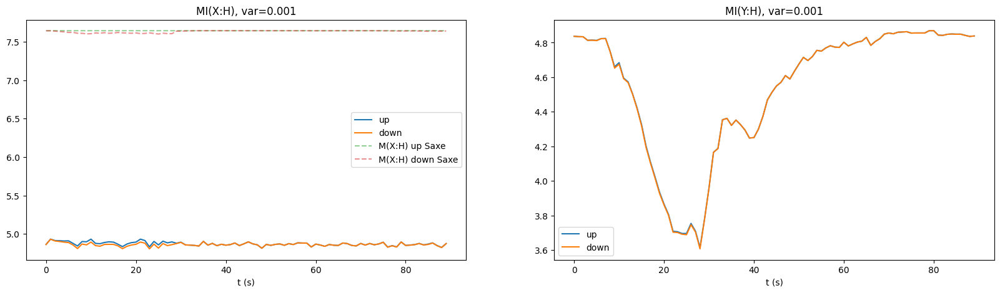

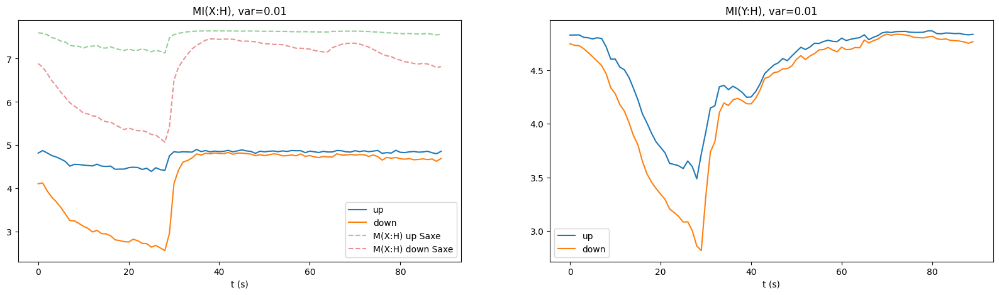

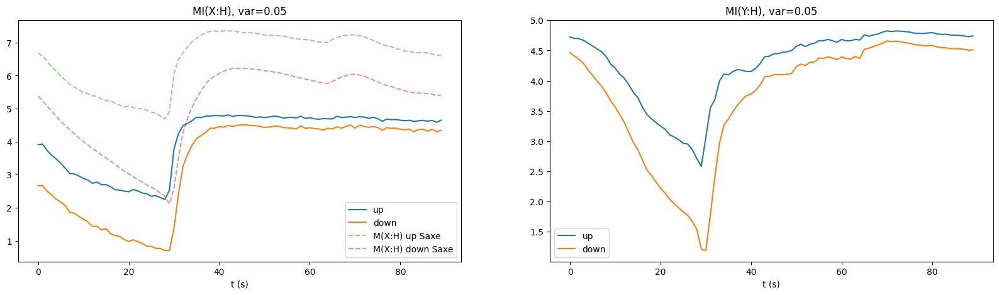

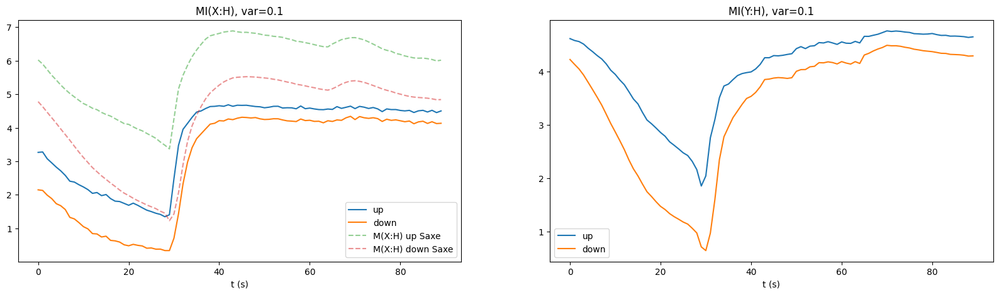

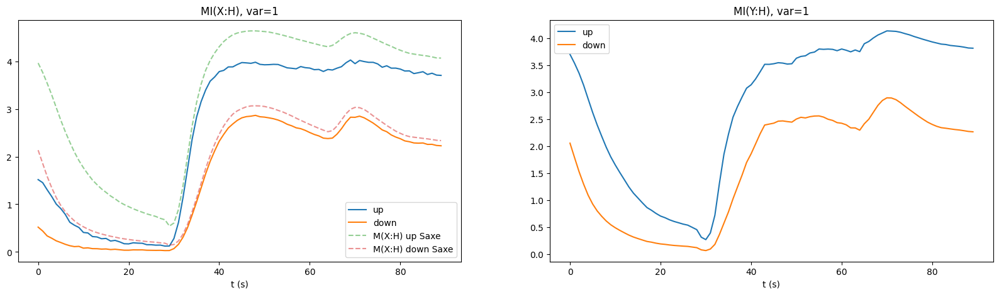

In [81]:
# mi through conditional entropy
var_values = [0.001, 0.01, 0.05, 0.1, 1]
for var in var_values:
    entropy_up = []
    entropy_down = []
    entropy_up_y = []
    entropy_down_y = []
    saxe_up = []
    saxe_down = []
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
    for t in range(90):
        E_u = MutualInformation(x[:,t,:], h[:,t,:], var = var, lower = False)
        entropy_up.append(E_u.mutual_information_cond_l())
        saxe_up.append(E_u.mutual_information_cond())
        E_d = MutualInformation(x[:,t,:], h[:,t,:], var = var, lower = True)
        entropy_down.append(E_d.mutual_information_cond_l())
        saxe_down.append(E_d.mutual_information_cond())
        E_u_y = MutualInformation(y[:,t,:], h[:,t,:], var = var, lower = False)
        entropy_up_y.append(E_u_y.mutual_information_cond_l())
        E_d_y = MutualInformation(y[:,t,:], h[:,t,:], var = var, lower = True)
        entropy_down_y.append(E_d_y.mutual_information_cond_l())
        
    ax[0].plot(range(90), entropy_up, label="up")
    ax[0].plot(range(90), entropy_down, label="down")
    ax[0].plot(range(timesteps), saxe_up, label="M(X:H) up Saxe", linestyle="--", alpha=0.5)
    ax[0].plot(range(timesteps), saxe_down, label="M(X:H) down Saxe", linestyle="--", alpha=0.5)
    ax[0].set_title("MI(X:H), var={}".format(var))
    ax[0].set_xlabel("t (s)")
    ax[1].plot(range(90), entropy_up_y, label="up")
    ax[1].plot(range(90), entropy_down_y, label="down")
    ax[1].set_title("MI(Y:H), var={}".format(var))
    ax[1].set_xlabel("t (s)")
    ax[0].legend()
    ax[1].legend()

### 4.2 Results on de-noised data
In order to solve the previously mentioned problem, one first approach is to remove all noise below a certain threshold value $\eta = 0.1$. In this scenario the label-based estimator is clearly superior to the naive version proposed by Saxe.

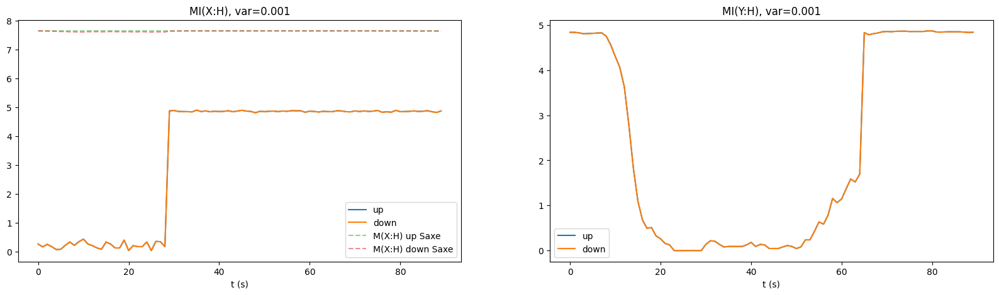

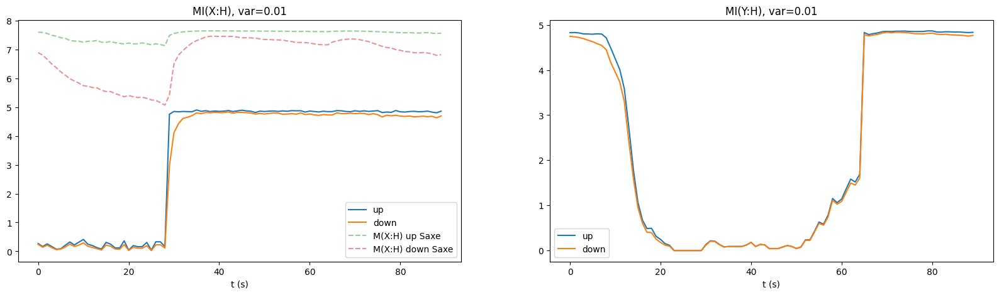

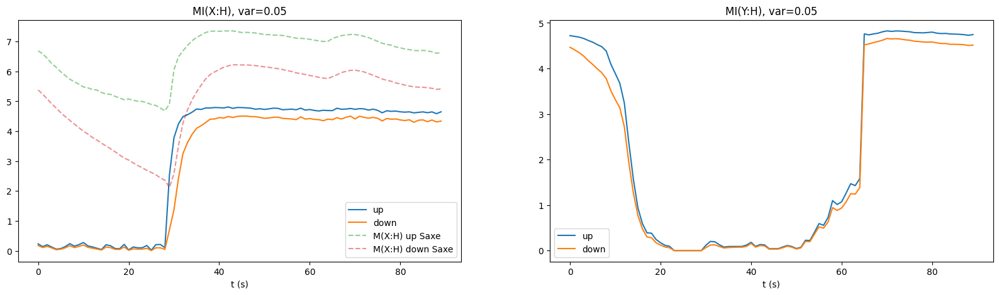

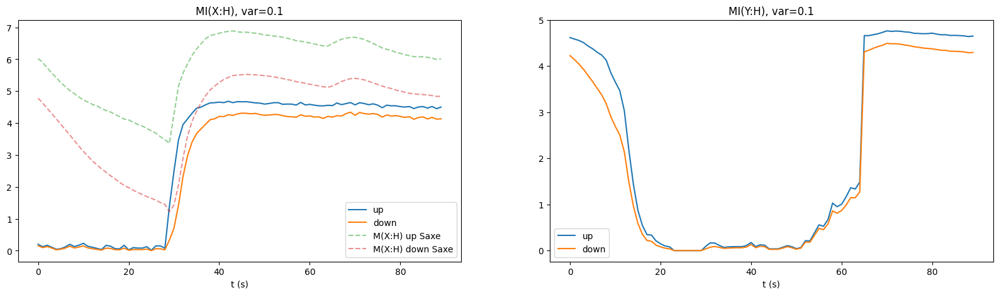

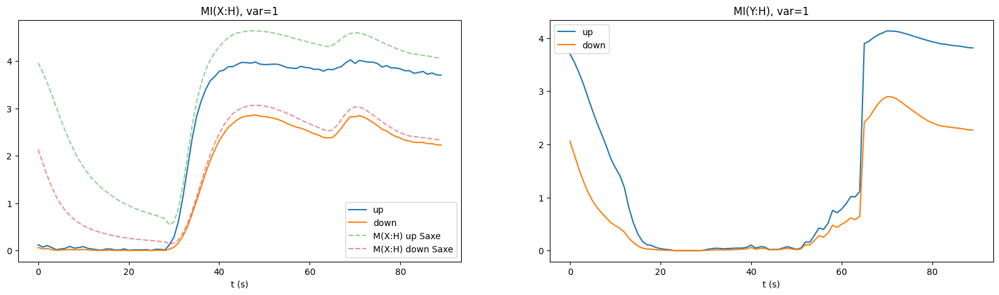

In [82]:
# mi through conditional entropy
var_values = [0.001, 0.01, 0.05, 0.1, 1]
for var in var_values:
    entropy_up = []
    entropy_down = []
    entropy_up_y = []
    entropy_down_y = []
    saxe_up = []
    saxe_down = []
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
    for t in range(90):
        E_u = MutualInformation(x_noiseless[:,t,:], h[:,t,:], var = var, lower = False)
        entropy_up.append(E_u.mutual_information_cond_l())
        saxe_up.append(E_u.mutual_information_cond())
        E_d = MutualInformation(x_noiseless[:,t,:], h[:,t,:], var = var, lower = True)
        entropy_down.append(E_d.mutual_information_cond_l())
        saxe_down.append(E_d.mutual_information_cond())
        E_u_y = MutualInformation(y_noiseless[:,t,:], h[:,t,:], var = var, lower = False)
        entropy_up_y.append(E_u_y.mutual_information_cond_l())
        E_d_y = MutualInformation(y_noiseless[:,t,:], h[:,t,:], var = var, lower = True)
        entropy_down_y.append(E_d_y.mutual_information_cond_l())
        
    ax[0].plot(range(90), entropy_up, label="up")
    ax[0].plot(range(90), entropy_down, label="down")
    ax[0].plot(range(timesteps), saxe_up, label="M(X:H) up Saxe", linestyle="--", alpha=0.5)
    ax[0].plot(range(timesteps), saxe_down, label="M(X:H) down Saxe", linestyle="--", alpha=0.5)
    ax[0].set_title("MI(X:H), var={}".format(var))
    ax[0].set_xlabel("t (s)")
    ax[1].plot(range(90), entropy_up_y, label="up")
    ax[1].plot(range(90), entropy_down_y, label="down")
    ax[1].set_title("MI(Y:H), var={}".format(var))
    ax[1].set_xlabel("t (s)")
    ax[0].legend()
    ax[1].legend()

### 4.3 Computing mutual information using pairwise distance function for conditional entropy estimation

Another approach to improve the mutual information estimation is to evaluate the conditional entropy differently, not by considering the argmax of the input/output data as the criterion for performing the conditional entropy estimation, but by researching a method that allows us to avoid the problems caused by the presence of noise without removing it.

We maintain the idea of binning, where we searched for a strategy to "group" input and output data in order to calculate the conditional probabilities. However, instead of aiming for perfect grouping, which may not be useful due to the potential overlap of continuous input/output signals by neighboring signals, we employ pairwise distance as a "grouping" tool. In this approach, we evaluate for each input/output signal which other samples are close to it within a threshold value $\epsilon$. We set $\epsilon_x = 0.08$ for input signals and $\epsilon_y = 0.02$ for output signals, as the fluctuations in non-active times have different intensities.

Then, for each sample $i$, we count the number of "neighbors" $n_i$ and associate to each of them a probability value $p_i = \frac{n_i}{\sum_i n_i}$, such that $\sum_i p_i = 1$.

Next, we obtain an estimate of the conditional entropy between each sample $i$ in the input/output and the hidden layer by considering the indices of the $n_i$ neighboring samples to identify its personal subgroup $h_{n_i}$ (it is worth noting that the number of groups in this approach is equal to the number of samples $N=200$ because the elements can be shared between groups). The estimate of conditional entropy becomes:
$$
H(h|X) = \sum_i p_i * \hat{H}_{\sigma}(h_{n_i}|i)
$$

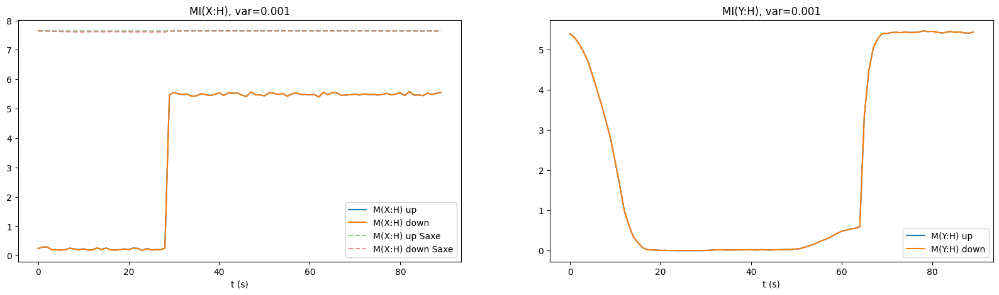

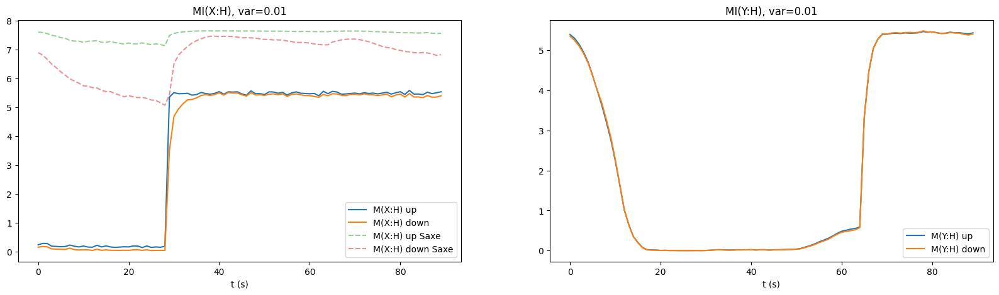

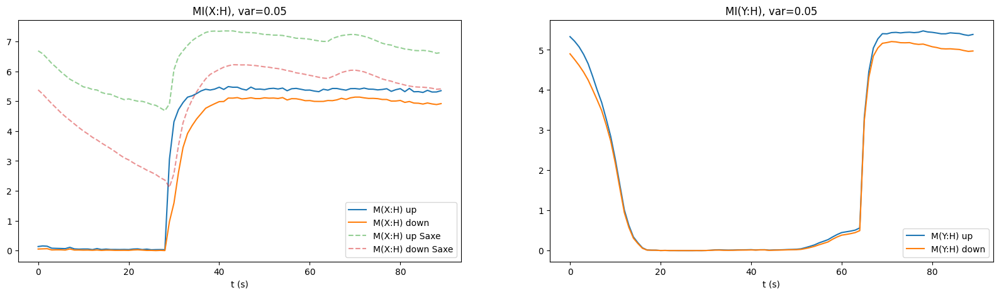

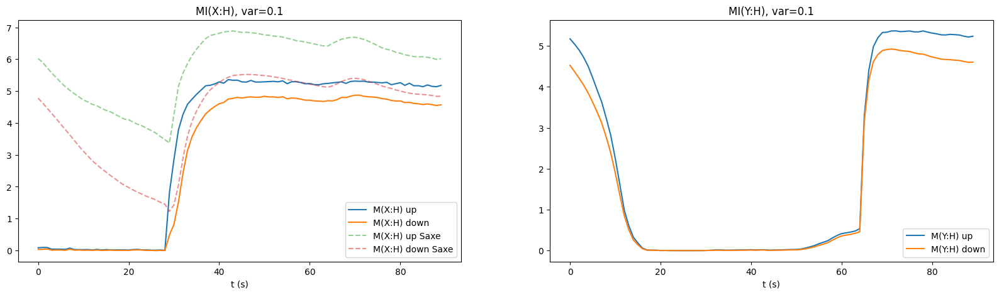

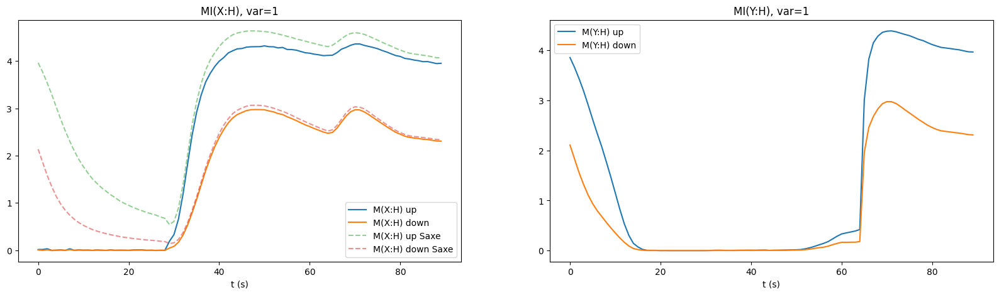

In [74]:
# mi through conditional entropy grouping using pairwise distance
var_values = [0.001, 0.01, 0.05, 0.1, 1]
timesteps = 90
for var in var_values:
    entropy_up = []
    entropy_down = []
    entropy_up_y = []
    entropy_down_y = []
    entropy_cond_up = []
    entropy_cond_down = []
    entropy_cond_up_y = []
    entropy_cond_down_y = []
    entropy_up_h = []
    entropy_down_h = []
    saxe_up = []
    saxe_down = []
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
    for t in range(timesteps):
        E_u = MutualInformation(x[:,t,:], h[:,t,:], var = var, lower = False)
        e1, c_h_x_u, e_h_u = E_u.mutual_information_cond_pair(inp=True)
        saxe_up.append(E_u.mutual_information_cond())
        entropy_up.append(e1)
        entropy_cond_up.append(c_h_x_u)
        entropy_up_h.append(e_h_u)
        E_d = MutualInformation(x[:,t,:], h[:,t,:], var = var, lower = True)
        e2, c_h_x_d, e_h_d = E_d.mutual_information_cond_pair(inp=True)
        saxe_down.append(E_d.mutual_information_cond())
        entropy_down.append(e2)
        entropy_cond_down.append(c_h_x_d)
        entropy_down_h.append(e_h_d)
        E_u_y = MutualInformation(y[:,t,:], h[:,t,:], var = var, lower = False)
        e3, c_h_y_u, _ = E_u_y.mutual_information_cond_pair(inp=False)
        entropy_up_y.append(e3)
        entropy_cond_up_y.append(c_h_y_u)
        E_d_y = MutualInformation(y[:,t,:], h[:,t,:], var = var, lower = True)
        e4, c_h_y_d, _ = E_d_y.mutual_information_cond_pair(inp=False)
        entropy_down_y.append(e4)
        entropy_cond_down_y.append(c_h_y_d)
        
    ax[0].plot(range(timesteps), entropy_up, label="M(X:H) up")
    ax[0].plot(range(timesteps), entropy_down, label="M(X:H) down")
    ax[0].plot(range(timesteps), saxe_up, label="M(X:H) up Saxe", linestyle="--", alpha=0.5)
    ax[0].plot(range(timesteps), saxe_down, label="M(X:H) down Saxe", linestyle="--", alpha=0.5)
    #ax[0].plot(range(timesteps), entropy_cond_up, label="H(H|X) up")
    #ax[0].plot(range(timesteps), entropy_cond_down, label="H(H|X) down")
    #ax[0].plot(range(timesteps), entropy_up_h, label="H(H) up")
    #ax[0].plot(range(timesteps), entropy_down_h, label="H(H) down")
    ax[0].set_title("MI(X:H), var={}".format(var))
    ax[0].set_xlabel("t (s)")
    ax[0].legend()
    ax[1].plot(range(timesteps), entropy_up_y, label="M(Y:H) up")
    ax[1].plot(range(timesteps), entropy_down_y, label="M(Y:H) down")
    #ax[1].plot(range(timesteps), entropy_cond_up_y, label="H(H|Y) up")
    #ax[1].plot(range(timesteps), entropy_cond_down_y, label="H(H|Y) down")
    #ax[1].plot(range(timesteps), entropy_up_h, label="H(H) up")
    #ax[1].plot(range(timesteps), entropy_down_h, label="H(H) down")
    ax[1].set_title("MI(Y:H), var={}".format(var))
    ax[1].set_xlabel("t (s)")
    ax[1].legend()

The above plots show the results for different variance values and a comparison with the naive approach of Saxe, where the conditional information is evaluated only considering the entropy of Gaussian noise.

We observe that this method is able to deal with the fluctuations of output and input data, avoiding the tail in non-active times for $MI(X:H)$, contrary to Saxe's method, and returning a low $MI(Y:H)$ for non-active times.

For variance values smaller than $\sigma^2 < 0.05$, the upper and lower bounds are equal, suggesting that in those frameworks the $T=h+\sigma^2N(0,1)$ signals are well-clustered.

## 5. Kraskov estimator

The Kraskov estimator for mutual information is an efficient, adaptive and widely used estimator with low bias which leverages entropy estimates from $k$-nearest neighbour distances<sup>[1]</sup>. Mutual information can be obtained by estimating the joint and marginal entropies and then employing

[1]: https://arxiv.org/pdf/cond-mat/0305641.pdf
\begin{equation}
MI(X, Y) = H(X) + H(Y) - H(X, Y).
\end{equation}
Using the maximum norm for $Z=(X,Y)$ and the digamma function $\psi(x) = \Gamma(x)^{-1}\frac{\mathrm{d}\Gamma(x)}{\mathrm{d}(x)}$, the mutual information $MI(X, Y)$ can be calculated as:
\begin{equation}
MI(X, Y) = \psi(k) - \langle \psi(n_x + 1) + \psi(n_y + 1) \rangle + \psi(N),
\end{equation}
where $n_x(i)$ is the number of points $x_j$ whose distance from $x_i$ is strictly less than half of the distance between $z_i=(x_i, y_i)$ and its $k$-nearest neighbour, and analogously for $y$.

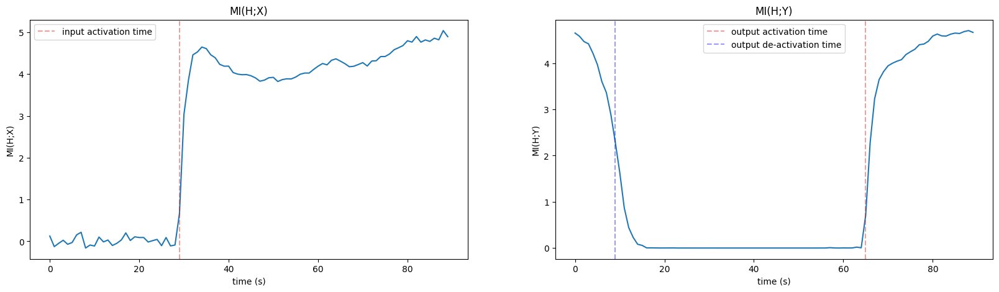

In [6]:
def mi_krask(x, y, k=1, base=2):
    intens = 1e-10  # small noise to break degeneracy
    x = x + intens * nr.rand(len(x[0]))
    y = y + intens * nr.rand(len(y[0]))
    # concatenate x and y for joint
    points = np.concatenate([x,y], axis=1)
    # Find nearest neighbors in joint space, p=inf means max-norm
    # K-D Tree is a binary tree in which each node represents a k-dimensional point
    # This class provides an index into a set of k-dimensional points which can be used to rapidly look up the nearest neighbors of any point.
    tree = ss.cKDTree(points)
    # The distances (1 value each) to the nearest neighbors for each element in points 
    dvec = [tree.query(point, k + 1, p=float('inf'))[0][k] for point in points] # len(dvec) = 200
    a, b, c, d = avgdigamma(x, dvec), avgdigamma(y, dvec), digamma(k), digamma(len(x))
    return (-a - b + c + d) / log(base)

def avgdigamma(points, dvec):
    # This part finds number of neighbors in some radius in the marginal space
    # returns expectation value of <psi(nx)>
    N = len(points) # 200
    tree = ss.cKDTree(points)
    avg = 0.
    for i in range(N):
        dist = dvec[i] # we use the distance value found
        # subtlety, we don't include the boundary point,
        # but we are implicitly adding 1 to kraskov def bc center point is included
        num_points = len(tree.query_ball_point(points[i], dist - 1e-15, p=float('inf')))
        avg += digamma(num_points) / N
    return avg

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
ev_MI = []
ev_MI_Y = []
for t in range(90):
    mi = mi_krask(x[:,t,:], h[:,t,:])
    ev_MI.append(mi)
    mi2 = mi_krask(y[:,t,:], h[:,t,:])
    ev_MI_Y.append(mi2)

ax[0].plot(range(90), ev_MI)
ax[1].plot(range(90), ev_MI_Y)
ax[0].set_xlabel("time (s)")
ax[0].set_ylabel("MI(H;X)")
ax[0].set_title("MI(H;X)")
ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.4, label="input activation time")
ax[1].set_ylabel("MI(H;Y)")
ax[1].set_xlabel("time (s)")
ax[1].set_title("MI(H;Y)")
ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.4, label="output activation time")
ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.4, label="output de-activation time")
ax[1].legend()
ax[0].legend()

### 5.1 analysis on k

The estimator derived by Kraskov et al. can be tuned to match the data structure at hand. Often $k=1$ is the natural choice which corresponds to resolving structures down to the smallest possible scales. On the other hand, a larger $k$ captures more global information but may oversmooth the estimate and miss local structure. The plots shown below demonstrate that the former choice is more suited for our data.

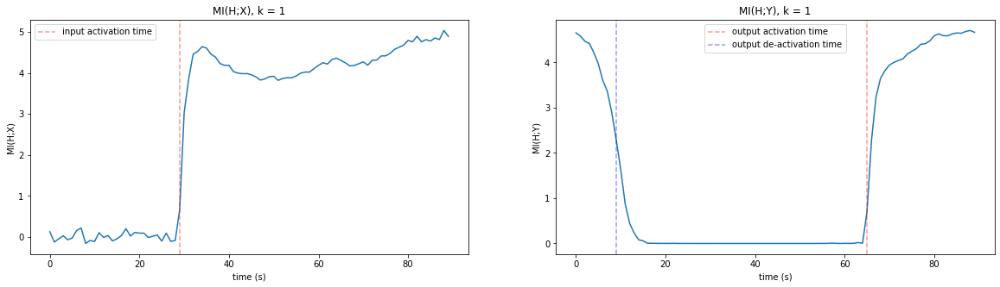

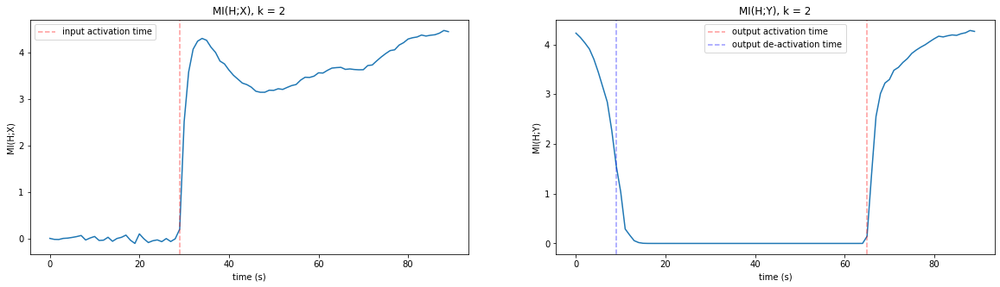

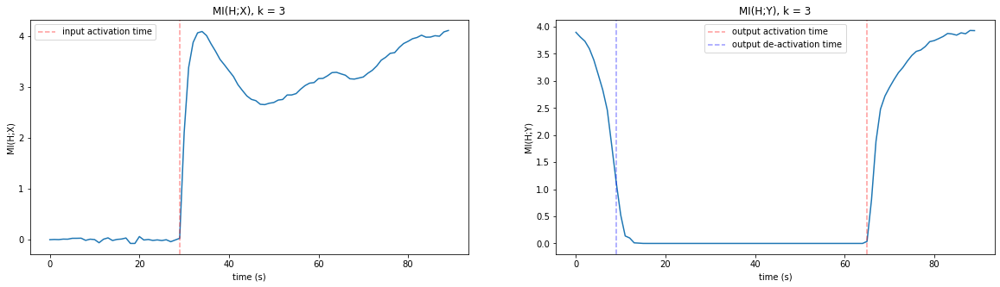

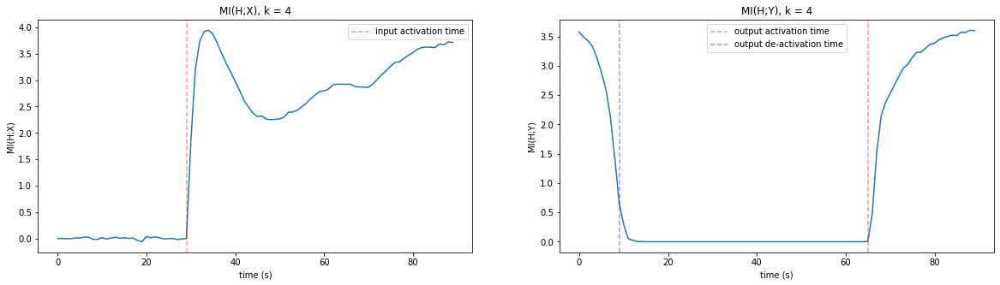

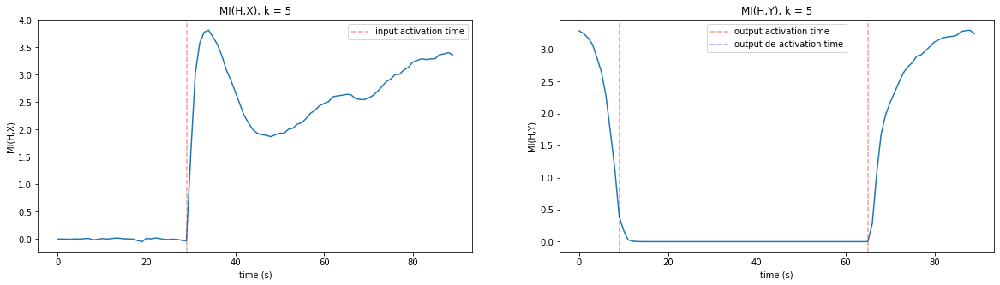

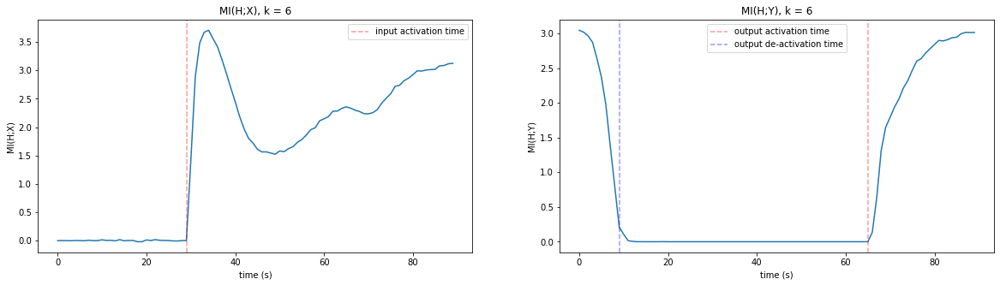

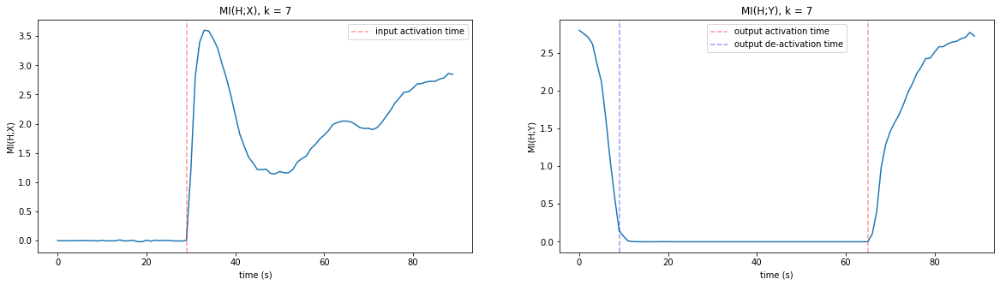

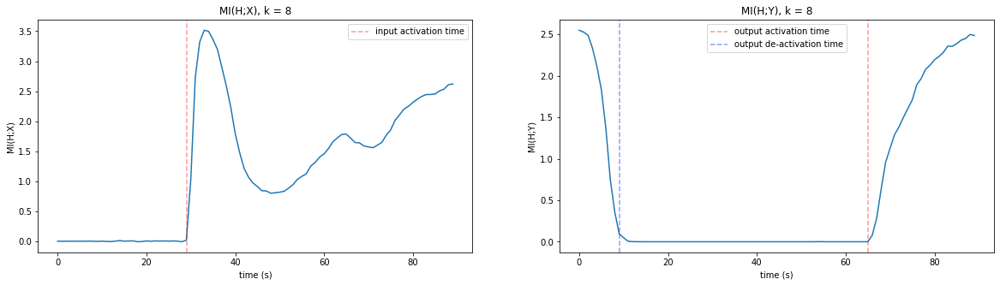

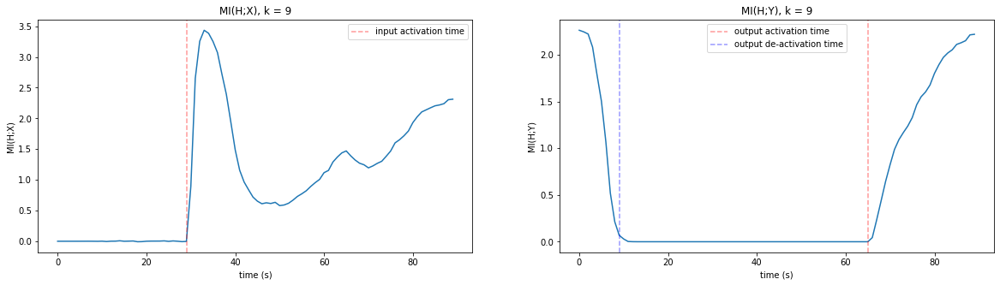

In [34]:
k_range = range(1,10)
for k in k_range:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
    ev_MI = []
    ev_MI_Y = []
    for t in range(90):
        
        mi = mi_krask(h[:,t,:], x[:,t,:], k=k)
        ev_MI.append(mi)
        mi2 = mi_krask(h[:,t,:], y[:,t,:], k=k)
        ev_MI_Y.append(mi2)
    
    ax[0].plot(range(90),ev_MI)
    ax[1].plot(range(90), ev_MI_Y)
    ax[0].set_xlabel("time (s)")
    ax[0].set_ylabel("MI(H;X)")
    ax[0].set_title("MI(H;X), k = {}".format(k))
    ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.4, label="input activation time")
    ax[1].set_ylabel("MI(H;Y)")
    ax[1].set_xlabel("time (s)")
    ax[1].set_title("MI(H;Y), k = {}".format(k))
    ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.4, label="output activation time")
    ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.4, label="output de-activation time")
    ax[1].legend()
    ax[0].legend()

## 6. Comparison of the methods

We can now show all the above estimators in action, albeit each with its limitation discussed in the previous sections, demonstrating a compatible outcomes across them.

CPU times: total: 39.4 s
Wall time: 1min 24s


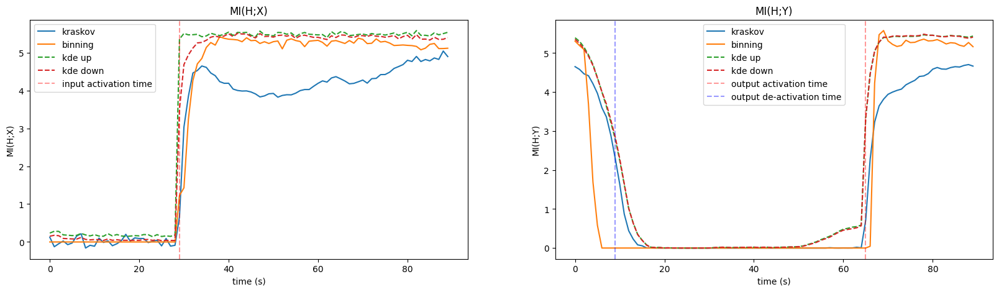

In [7]:
%%time
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
mix_kraskov = []
miy_kraskov = []
mix_binning = []
miy_binning = []
mix_kde_up = []
miy_kde_up = []
mix_kde_down = []
miy_kde_down = []
for t in range(90):
    mi_k = mi_krask(x[:,t,:], h[:,t,:])
    mix_kraskov.append(mi_k)
    _, _, _, mi_b = hard_binning(x[:,t,:], h[:,t,:], nbins=2)
    mix_binning.append(mi_b)
    E_u = MutualInformation(x[:,t,:], h[:,t,:], var = 0.01, lower = False)
    mi_g, _, _ = E_u.mutual_information_cond_pair(inp=True)
    mix_kde_up.append(mi_g)
    E_u2 = MutualInformation(x[:,t,:], h[:,t,:], var = 0.01, lower = True)
    mi_g2, _, _ = E_u2.mutual_information_cond_pair(inp=True)
    mix_kde_down.append(mi_g2)
    
    mi2_k = mi_krask(y[:,t,:], h[:,t,:])
    miy_kraskov.append(mi2_k)
    _, _, _, mi2_b = hard_binning(y[:,t,:], h[:,t,:], nbins=2)
    miy_binning.append(mi2_b)
    E_u3 = MutualInformation(y[:,t,:], h[:,t,:], var = 0.01, lower = False)
    mi_g3, _, _ = E_u3.mutual_information_cond_pair(inp=False)
    miy_kde_up.append(mi_g3)
    E_u4 = MutualInformation(y[:,t,:], h[:,t,:], var = 0.01, lower = True)
    mi_g4, _, _ = E_u4.mutual_information_cond_pair(inp=False)
    miy_kde_down.append(mi_g4)

ax[0].plot(range(90), mix_kraskov, label="kraskov")
ax[1].plot(range(90), miy_kraskov, label="kraskov")
ax[0].plot(range(90), mix_binning, label="binning")
ax[1].plot(range(90), miy_binning, label="binning")
ax[0].plot(range(90), mix_kde_up, label="kde up", linestyle="--")
ax[1].plot(range(90), miy_kde_up, label="kde up", linestyle="--")
ax[0].plot(range(90), mix_kde_down, label="kde down", linestyle="--")
ax[1].plot(range(90), miy_kde_down, label="kde down", linestyle="--")
ax[0].set_xlabel("time (s)")
ax[0].set_ylabel("MI(H;X)")
ax[0].set_title("MI(H;X)")
ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.4, label="input activation time")
ax[1].set_ylabel("MI(H;Y)")
ax[1].set_xlabel("time (s)")
ax[1].set_title("MI(H;Y)")
ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.4, label="output activation time")
ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.4, label="output de-activation time")
ax[0].legend()
ax[1].legend()

## 7. Single neuron analysis

By estimating MI from an individual hidden neuron perspective, with both the network's input and output layers, we aim to identify which neurons carry the most information. Additionally, analyzing MI over time allows to observe the evolution of information content of individual neurons throughout the network's processing of input data. Finally, differences between the MI of different units might point to different roles within the network.

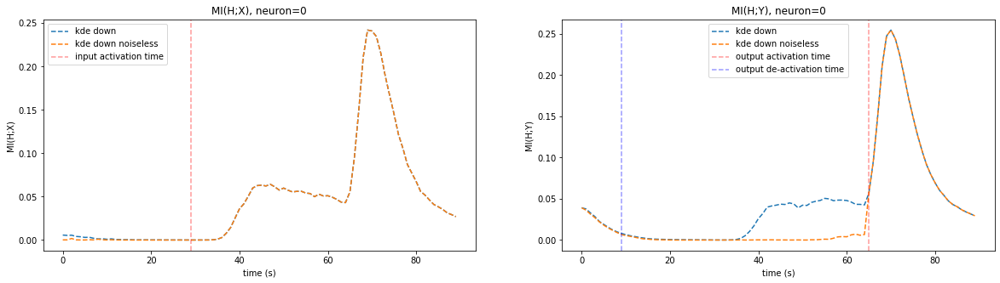

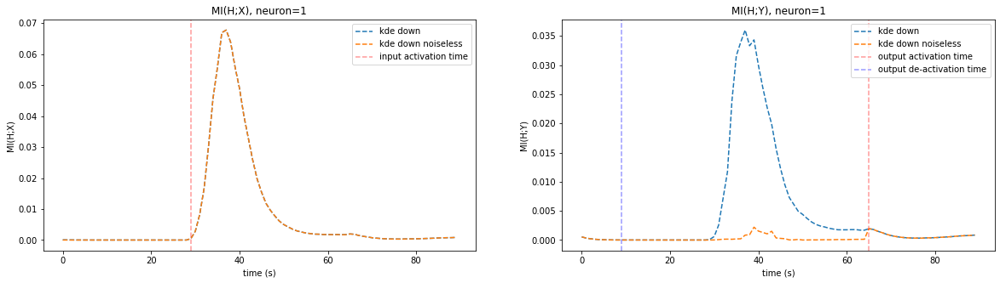

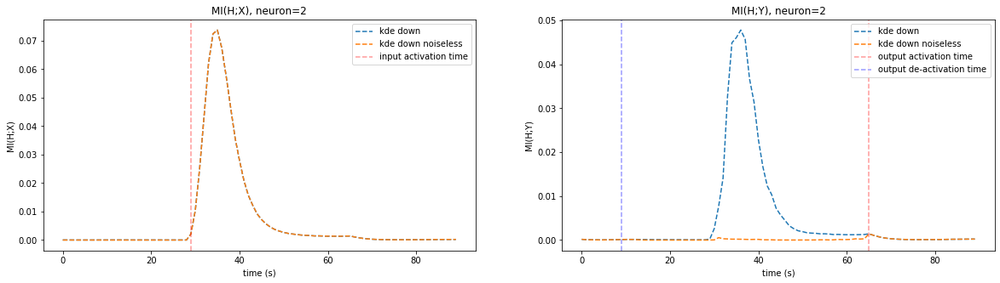

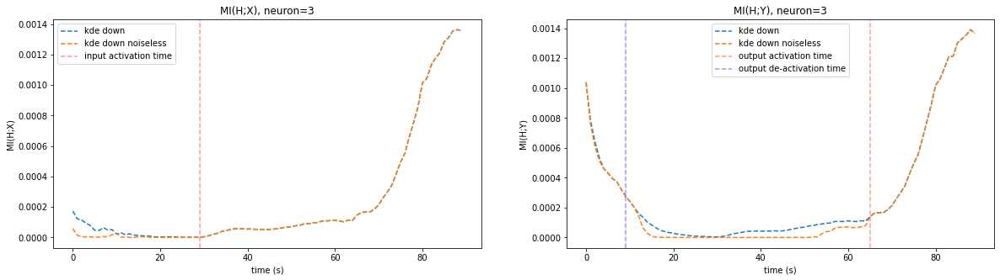

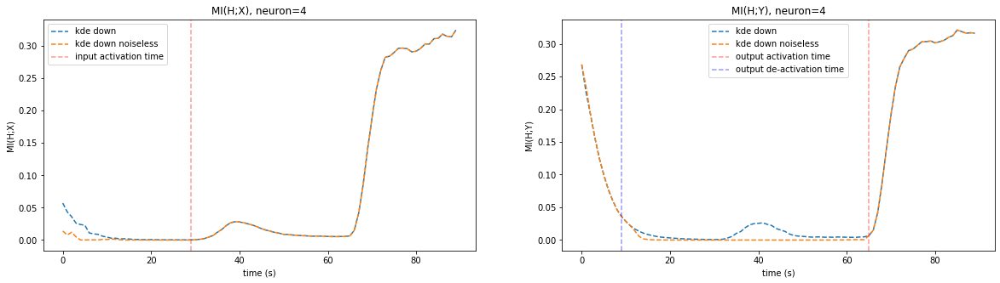

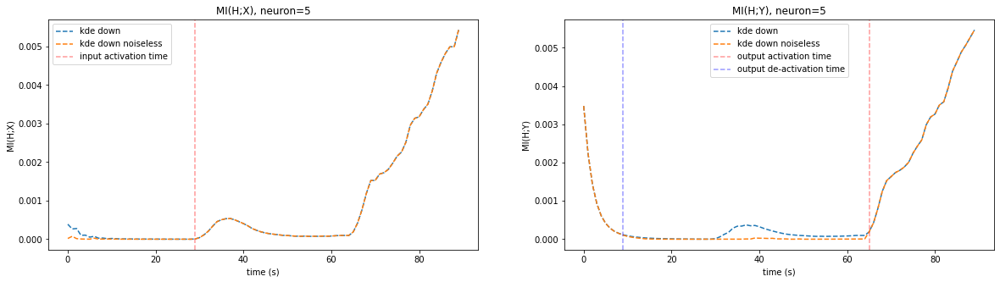

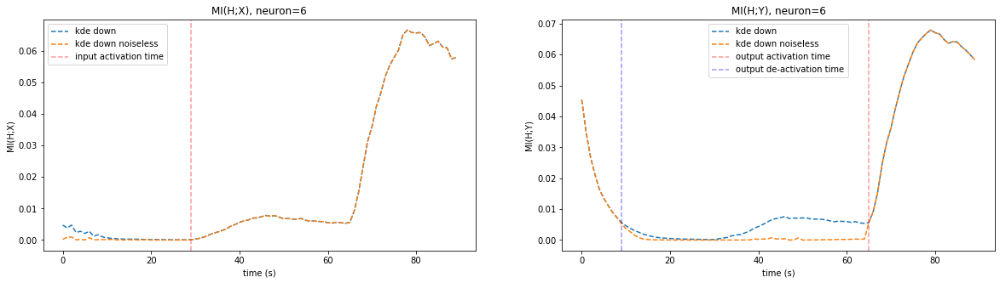

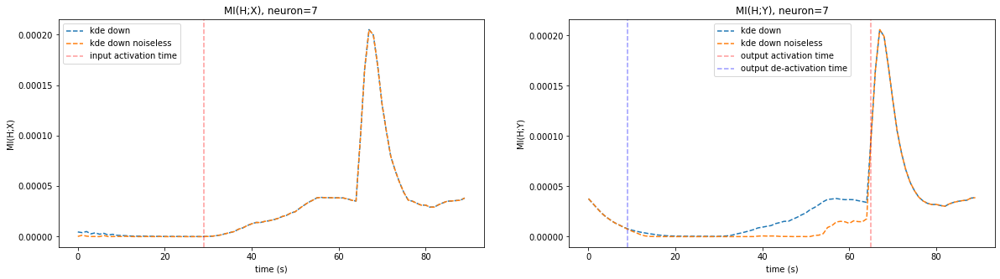

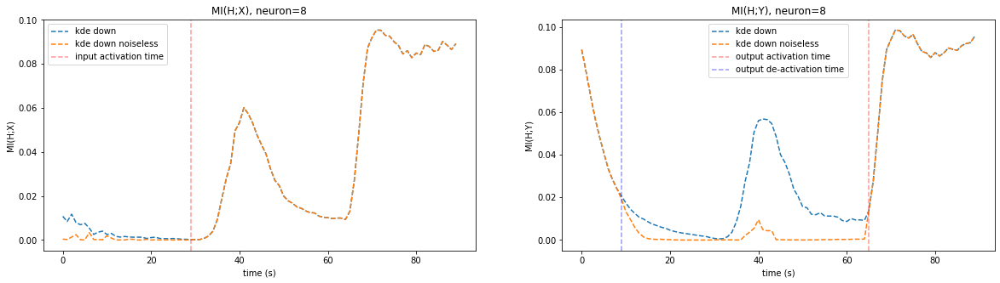

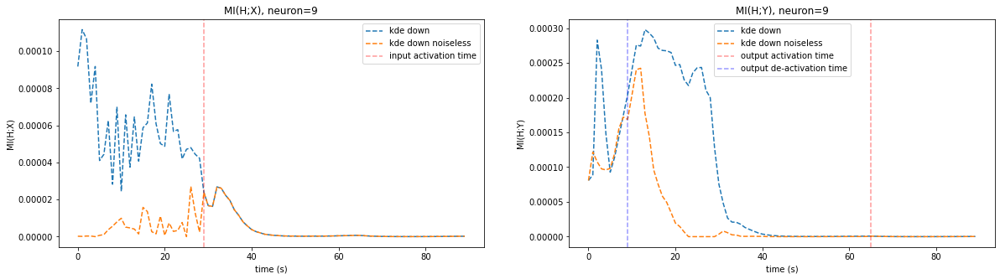

In [96]:
#noise vs noiseless
for n in range(10):
    if (n < 10): fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
    mix_kde_down = []
    miy_kde_down = []
    mix_kde_down_noiseless = []
    miy_kde_down_noiseless = []
    for t in range(90):
        E_u2 = MutualInformation(x[:,t,:], h[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g2 = E_u2.mutual_information_cond_l()
        mix_kde_down.append(mi_g2)
        E_u2 = MutualInformation(x_noiseless[:,t,:], h[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g2 = E_u2.mutual_information_cond_l()
        mix_kde_down_noiseless.append(mi_g2)
        
        E_u4 = MutualInformation(y[:,t,:], h[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g4 = E_u4.mutual_information_cond_l()
        miy_kde_down.append(mi_g4)
        E_u4 = MutualInformation(y_noiseless[:,t,:], h[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g4 = E_u4.mutual_information_cond_l()
        miy_kde_down_noiseless.append(mi_g4)

    ax[0].plot(range(90), mix_kde_down, label="kde down", linestyle="--")
    ax[1].plot(range(90), miy_kde_down, label="kde down", linestyle="--")
    ax[0].plot(range(90), mix_kde_down_noiseless, label="kde down noiseless", linestyle="--")
    ax[1].plot(range(90), miy_kde_down_noiseless, label="kde down noiseless", linestyle="--")
    ax[0].set_xlabel("time (s)")
    ax[0].set_ylabel("MI(H;X)")
    ax[0].set_title("MI(H;X), neuron={}".format(n))
    ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.4, label="input activation time")
    ax[1].set_ylabel("MI(H;Y)")
    ax[1].set_xlabel("time (s)")
    ax[1].set_title("MI(H;Y), neuron={}".format(n))
    ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.4, label="output activation time")
    ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.4, label="output de-activation time")
    ax[0].legend()
    ax[1].legend()

In [109]:
%%time
# stackxu=np.array(range(90))
# stackyu=np.array(range(90))
stackxd=np.array(range(90))
stackyd=np.array(range(90))
# visualization of mutual information considering one unit (neuron) at time
for n in range(256):
    mix_kde_down = []
    miy_kde_down = []
    for t in range(90):
        
        E_u2 = MutualInformation(x_noisless[:,t,:], h[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g2 = E_u2.mutual_information_cond_l()
        mix_kde_down.append(mi_g2)
        
        E_u4 = MutualInformation(y_noisless[:,t,:], h[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g4 = E_u4.mutual_information_cond_l()
        miy_kde_down.append(mi_g4)
    #stackxu=np.vstack((stackxu, np.array(mix_kde_up)))
    stackxd=np.vstack((stackxd, np.array(mix_kde_down)))
    #stackyu=np.vstack((stackyu, np.array(miy_kde_up)))
    stackyd=np.vstack((stackyd, np.array(miy_kde_down)))
    

CPU times: total: 16min 23s
Wall time: 9min 55s


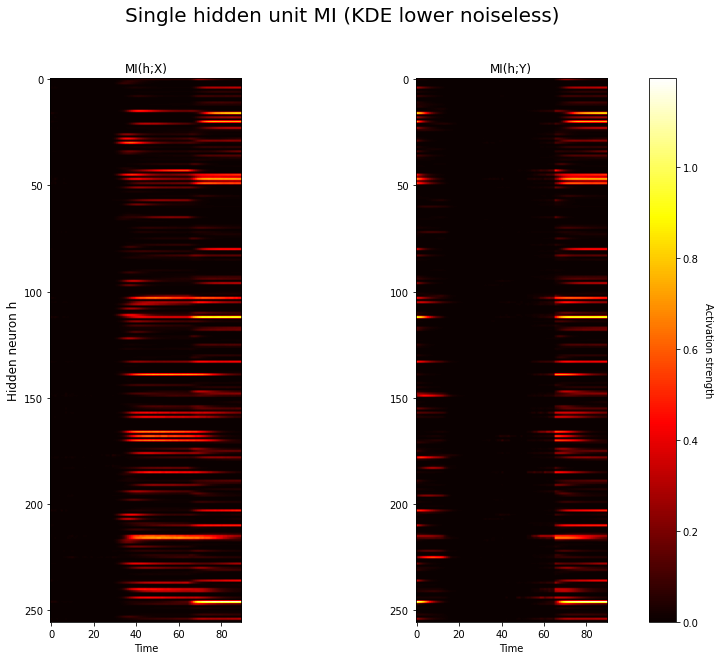

In [110]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,10))
# im = ax[0,0].imshow(stackxu[1:], cmap="hot")
# im = ax[0,1].imshow(stackyx[:], cmap="hot")
im = ax[0].imshow(stackxd[1:], cmap="hot")
im = ax[1].imshow(stackyd[1:], cmap="hot")
# ax[0,0].set_title("Single hidden neuron MI X upp")
# ax[0,1].set_title("Single hidden neuron MI Y upp")
ax[0].set_title("MI(h;X)")
ax[1].set_title("MI(h;Y)")
ax[0].set_ylabel("Hidden neuron h", size=12)
cbar = fig.colorbar(im, ax=ax.ravel())
#cbar = ax[0,0].figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel("Activation strength", rotation=-90, va="bottom")
#fig.tight_layout()
plt.suptitle("Single hidden unit MI (KDE lower noiseless)", size=20)
#plt.subplots_adjust(top=0.8)
ax[0].set_xlabel("Time")
ax[1].set_xlabel("Time")
plt.show()

Neurons with higher MI values, i.e. more "active", are likely to play a more critical role in representing and processing information relevant to the network's task. There seems to be a direct link between initially and finally active neurons with respect to the output, while the dynamics for single units can also be not static over time. Both the de-activation of some neurons over time and presence of "silent" neurons, that is non saturation of the full net, may indicate redundancy in the information encoded by those neurons over the whole network structure.

# Reservoir data

In [59]:
with np.load('reservoir_data.npz') as data:
    r_0 = data["arr_0"] # input (?)
    r_1 = data["arr_1"] # recurrent layer
    r_2 = data["arr_2"] # output (?)

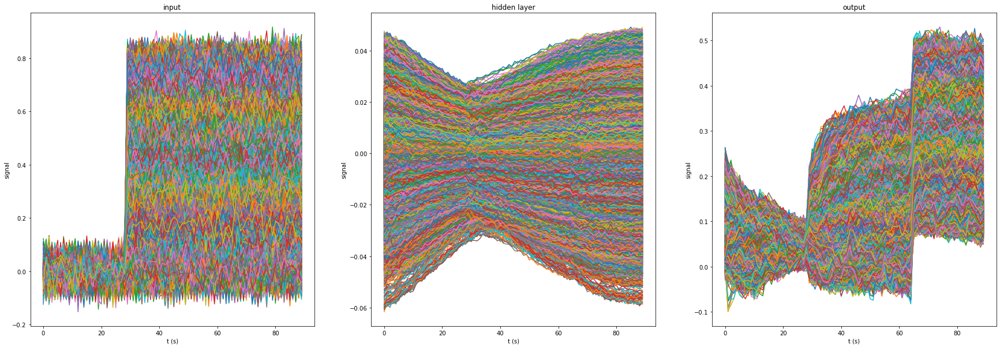

In [113]:
# coarse visualtization
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30,10))
for j in range(200):
    for d in range(32):
        ax[0].plot(range(90), r_0[j,:,d])
        ax[0].set_title("input")
        ax[2].plot(range(90), r_2[j,:,d])
        ax[2].set_title("output")
    for n in range(256):
        ax[1].plot(range(90), r_1[j,:,n])
        ax[1].set_title("hidden layer")
    for i in range(3):
        ax[i].set_xlabel("t (s)")
        ax[i].set_ylabel("signal")

As can be readily seen, the absolute values of the activities are much lower for the reservoir data. Interestingly, the feature complexity and information encoding appear to be shifted from the hidden layer in the original data, to the output layer for reservoir data, in line with the training procedure employed.

Firstly, we shall note that the reservoir data does not exhibit the same problems when estimating MI with noise.

CPU times: total: 2min 11s
Wall time: 1min 39s


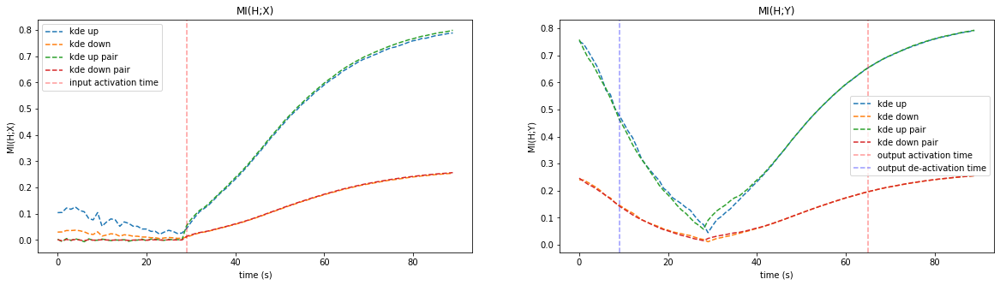

In [115]:
%%time
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
mix_kde_up = []
miy_kde_up = []
mix_kde_down = []
miy_kde_down = []
mix_kde_up_p = []
miy_kde_up_p = []
mix_kde_down_p = []
miy_kde_down_p = []
for t in range(90):
    
    E_u = MutualInformation(r_0[:,t,:], r_1[:,t,:], var = 0.01, lower = False)
    mi_g = E_u.mutual_information_cond_l()
    mix_kde_up.append(mi_g)
    mi_g, _, _ = E_u.mutual_information_cond_pair(inp = True)
    mix_kde_up_p.append(mi_g)
    
    E_u2 = MutualInformation(r_0[:,t,:], r_1[:,t,:], var = 0.01, lower = True)
    mi_g2= E_u2.mutual_information_cond_l()
    mix_kde_down.append(mi_g2)
    mi_g2, _, _ = E_u2.mutual_information_cond_pair(inp = True)
    mix_kde_down_p.append(mi_g2)
    
    E_u3 = MutualInformation(r_2[:,t,:], r_1[:,t,:], var = 0.01, lower = False)
    mi_g3= E_u3.mutual_information_cond_l()
    miy_kde_up.append(mi_g3)
    mi_g3, _, _ = E_u3.mutual_information_cond_pair(inp = False)
    miy_kde_up_p.append(mi_g3)
    
    E_u4 = MutualInformation(r_2[:,t,:], r_1[:,t,:], var = 0.01, lower = True)
    mi_g4 = E_u4.mutual_information_cond_l()
    miy_kde_down.append(mi_g4)
    mi_g4, _, _ = E_u4.mutual_information_cond_pair(inp = False)
    miy_kde_down_p.append(mi_g4)

ax[0].plot(range(90), mix_kde_up, label="kde up", linestyle="--")
ax[1].plot(range(90), miy_kde_up, label="kde up", linestyle="--")
ax[0].plot(range(90), mix_kde_down, label="kde down", linestyle="--")
ax[1].plot(range(90), miy_kde_down, label="kde down", linestyle="--")
ax[0].plot(range(90), mix_kde_up_p, label="kde up pair", linestyle="--")
ax[1].plot(range(90), miy_kde_up_p, label="kde up pair", linestyle="--")
ax[0].plot(range(90), mix_kde_down_p, label="kde down pair", linestyle="--")
ax[1].plot(range(90), miy_kde_down_p, label="kde down pair", linestyle="--")
ax[0].set_xlabel("time (s)")
ax[0].set_ylabel("MI(H;X)")
ax[0].set_title("MI(H;X)")
ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.4, label="input activation time")
ax[1].set_ylabel("MI(H;Y)")
ax[1].set_xlabel("time (s)")
ax[1].set_title("MI(H;Y)")
ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.4, label="output activation time")
ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.4, label="output de-activation time")
ax[0].legend()
ax[1].legend()

The mutual information shows only a slightly different behavior in this setting, although on totally different scale. The information flow seems much more gradual in this training scenario.

CPU times: total: 2min 48s
Wall time: 3min 4s


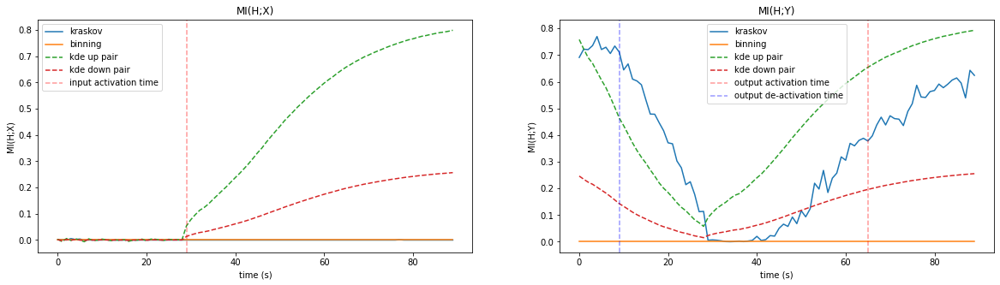

In [117]:
%%time
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
mix_kraskov = []
miy_kraskov = []
mix_binning = []
miy_binning = []
mix_kde_up = []
miy_kde_up = []
mix_kde_down = []
miy_kde_down = []
for t in range(90):
    mi_k = mi_krask(r_0[:,t,:], r_1[:,t,:])
    mix_kraskov.append(mi_k)
    _, _, _, mi_b = hard_binning(r_0[:,t,:], r_1[:,t,:])
    mix_binning.append(mi_b)
    E_u = MutualInformation(r_0[:,t,:], r_1[:,t,:], var = 0.01, lower = False)
    mi_g, _, _ = E_u.mutual_information_cond_pair(inp = True)
    mix_kde_up.append(mi_g)
    E_u2 = MutualInformation(r_0[:,t,:], r_1[:,t,:], var = 0.01, lower = True)
    mi_g2, _, _ = E_u2.mutual_information_cond_pair(inp = True)
    mix_kde_down.append(mi_g2)
    
    mi2_k = mi_krask(r_2[:,t,:], r_1[:,t,:])
    miy_kraskov.append(mi2_k)
    _, _, _, mi2_b = hard_binning(r_2[:,t,:], r_1[:,t,:])
    miy_binning.append(mi2_b)
    E_u3 = MutualInformation(r_2[:,t,:], r_1[:,t,:], var = 0.01, lower = False)
    mi_g3, _, _ = E_u3.mutual_information_cond_pair(inp = False)
    miy_kde_up.append(mi_g3)
    E_u4 = MutualInformation(r_2[:,t,:], r_1[:,t,:], var = 0.01, lower = True)
    mi_g4, _, _ = E_u4.mutual_information_cond_pair(inp = False)
    miy_kde_down.append(mi_g4)

ax[0].plot(range(90), mix_kraskov, label="kraskov")
ax[1].plot(range(90), miy_kraskov, label="kraskov")
ax[0].plot(range(90), mix_binning, label="binning")
ax[1].plot(range(90), miy_binning, label="binning")
ax[0].plot(range(90), mix_kde_up, label="kde up pair", linestyle="--")
ax[1].plot(range(90), miy_kde_up, label="kde up pair", linestyle="--")
ax[0].plot(range(90), mix_kde_down, label="kde down pair", linestyle="--")
ax[1].plot(range(90), miy_kde_down, label="kde down pair", linestyle="--")
ax[0].set_xlabel("time (s)")
ax[0].set_ylabel("MI(H;X)")
ax[0].set_title("MI(H;X)")
ax[0].axvline(x=29, color="red", linestyle="--", alpha=0.4, label="input activation time")
ax[1].set_ylabel("MI(H;Y)")
ax[1].set_xlabel("time (s)")
ax[1].set_title("MI(H;Y)")
ax[1].axvline(x=65, color="red", linestyle="--", alpha=0.4, label="output activation time")
ax[1].axvline(x=9, color="blue", linestyle="--", alpha=0.4, label="output de-activation time")
ax[0].legend()
ax[1].legend()

As can be guessed by the final plot, not all the developed methods prove successful in this setting. Indeed only the MI estimation with KDE- gaussian method gives apparently sensible results. While the reason may superficially be attributed to low overall absolute activities of the hidden layer and a shift of complexity towards the output layer, a deeper analysis is needed.

In [111]:
%%time
# stackxu=np.array(range(90))
# stackyu=np.array(range(90))
stackxd=np.array(range(90))
stackyd=np.array(range(90))
# visualization of mutual information considering one unit (neuron) at time
for n in range(256):
    mix_kde_down = []
    miy_kde_down = []
    for t in range(90):
        
        E_u2 = MutualInformation(r_0[:,t,:], r_1[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g2 = E_u2.mutual_information_cond_l()
        mix_kde_down.append(mi_g2)
        
        E_u4 = MutualInformation(r_2[:,t,:], r_1[:,t,n].reshape(200,1), var = 0.1, lower = True)
        mi_g4 = E_u4.mutual_information_cond_l()
        miy_kde_down.append(mi_g4)
    #stackxu=np.vstack((stackxu, np.array(mix_kde_up)))
    stackxd=np.vstack((stackxd, np.array(mix_kde_down)))
    #stackyu=np.vstack((stackyu, np.array(miy_kde_up)))
    stackyd=np.vstack((stackyd, np.array(miy_kde_down)))
    

CPU times: total: 20min 55s
Wall time: 12min 34s


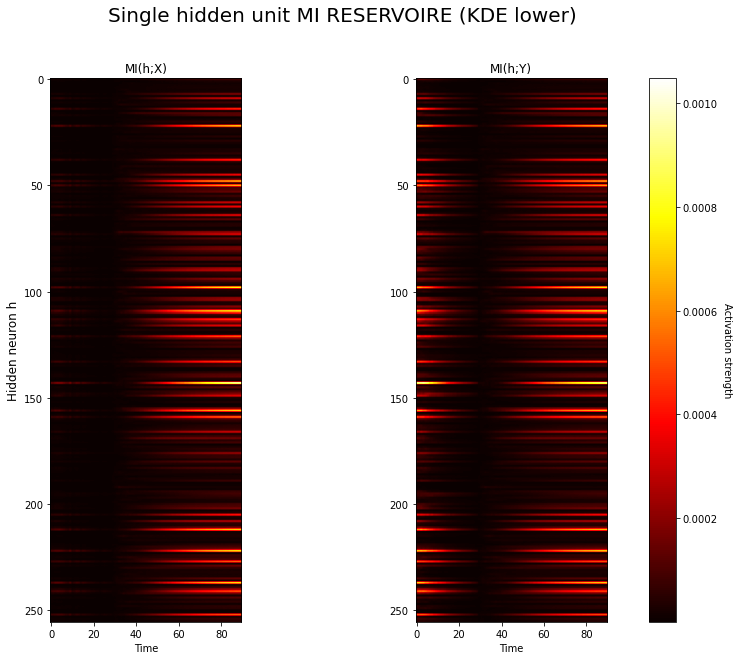

In [112]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,10))
# im = ax[0,0].imshow(stackxu[1:], cmap="hot")
# im = ax[0,1].imshow(stackyx[:], cmap="hot")
im = ax[0].imshow(stackxd[1:], cmap="hot")
im = ax[1].imshow(stackyd[1:], cmap="hot")
# ax[0,0].set_title("Single hidden neuron MI X upp")
# ax[0,1].set_title("Single hidden neuron MI Y upp")
ax[0].set_title("MI(h;X)")
ax[1].set_title("MI(h;Y)")
ax[0].set_ylabel("Hidden neuron h", size=12)
cbar = fig.colorbar(im, ax=ax.ravel())
#cbar = ax[0,0].figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel("Activation strength", rotation=-90, va="bottom")
#fig.tight_layout()
plt.suptitle("Single hidden unit MI RESERVOIRE (KDE lower)", size=20)
#plt.subplots_adjust(top=0.8)
ax[0].set_xlabel("Time")
ax[1].set_xlabel("Time")
plt.show()

With the reservoir data we can observe a similar non saturation of active neurons as some have very low MI throughout the entire time interval. At the same time however, these units exhibit a non dynamic behaviour, with at least non-decreasing activation, possibly due to the output driven training.